# Prova Pratica Paradigmas de Aprendizagem de maquina

Aluno: Augusto Miguel Faustino Dos Santos

Matricula: 20210024765

In [1]:
#aumentado a capacidade de visualização de colunas e linhas
import pandas as pd

pd.set_option('display.max_columns', 7000)
pd.set_option('display.max_rows',90000)

# Pre Processamento

## Carregando os dados 

In [37]:
# Carregar e normalizar o DataFrame do sinais.csv

sinais = pd.read_csv('sinais.csv')
print(sinais.iloc[0])


file_name       Adição_AP_10.json
width                         738
height                       1008
duration_sec             4.533333
num_frames                    136
sinal                      Adição
interprete                Alexson
Name: 0, dtype: object


In [38]:
len(sinais)

2502

## corrigindo nome de arquivo 

Por acaso quando tava olhando o csv achei uma linha sem o nome do arquivo

Bolsa de estudo_CS_10.json,634,858,7.033333333333333,211,Bolsa de Estudos,Cecilia
Bolsa de estudo_CS_1.json,644,858,3.1333333333333333,94,Bolsa de Estudos,Cecilia
Bolsa de estudo_CS_2.json,648,860,5.166666666666667,155,Bolsa de Estudos,Cecilia
,632,860,5.166666666666667,155,Bolsa de Estudos,Cecilia
Bolsa de estudo_CS_4.json,640,860,5.133333333333334,154,Bolsa de Estudos,Cecilia
Bolsa de estudo_CS_5.json,624,858,4.6,138,Bolsa de Estudos,Cecilia
Bolsa de estudo_CS_6.json,654,858,4.933333333333334,148,Bolsa de Estudos,Cecilia
Bolsa de estudo_CS_7.json,640,858,4.966666666666667,149,Bolsa de Estudos,Cecilia
Bolsa de estudo_CS_8.json,646,860,5.133333333333334,154,Bolsa de Estudos,Cecilia
Bolsa de estudo_CS_9.json,634,858,4.466666666666667,134,Bolsa de Estudos,Cecilia

In [ ]:

# Criar a condição de busca com todos os valores conhecidos
condicao = (sinais['width'] == 632) & \
           (sinais['height'] == 860) & \
           (sinais['num_frames'] == 155) & \
           (sinais['sinal'] == 'Bolsa de Estudos') & \
           (sinais['interprete'] == 'Cecilia')

#  Localizar e exibir a linha 
linha_encontrada = sinais[condicao]

print("--- Linha encontrada com base nos valores ---")
print(linha_encontrada)

# corrigir o nome do arquivo para a linha encontrada
nome_arquivo_faltante = 'Bolsa de estudo_CS_3.json' 
sinais.loc[condicao, 'file_name'] = nome_arquivo_faltante

print("\n--- Verificação após inserir o nome do arquivo ---")
print(sinais[condicao])
print(f"\nTotal de linhas no DataFrame após a correção: {len(sinais)}")

--- Linha encontrada com base nos valores ---
    file_name  width  height  duration_sec  num_frames             sinal  \
565       NaN    632     860      5.166667         155  Bolsa de Estudos   

    interprete  
565    Cecilia  

--- Verificação após inserir o nome do arquivo ---
                     file_name  width  height  duration_sec  num_frames  \
565  Bolsa de estudo_CS_3.json    632     860      5.166667         155   

                sinal interprete  
565  Bolsa de Estudos    Cecilia  

Total de linhas no DataFrame após a correção: 2502


## normalizando os nomes dos arquivos 

In [ ]:
# a coluna file_name tem nomes de arquivos com acentuação, trocar os nomes dos arquivos para nomes sem acentuação
import pandas as pd
import glob
import os
import json
from unidecode import unidecode

def normalize_filename(filename):
    """Normaliza o nome de um arquivo, removendo acentos e caracteres especiais."""
    # Remove a extensão do arquivo, normalizar o nome, e adiciona a extensão novamente.
    base, ext = os.path.splitext(filename)
    normalized_base = unidecode(base).replace(" ", "_").replace("-", "_")
    return normalized_base + ext


# Remove linhas onde file_name está ausente (NaN)
sinais = sinais[sinais['file_name'].notna()].copy()
# Normaliza os nomes dos arquivos na coluna 'file_name'
sinais['file_name_normalized'] = sinais['file_name'].apply(normalize_filename)
sinais['file_name'] = sinais['file_name_normalized']
sinais.drop(columns=['file_name_normalized'], inplace=True)
print("DataFrame sinais.csv carregado e normalizado com sucesso!")

print(f"Total de linhas no DataFrame após remover NaN: {len(sinais)}")
sinais.head()

DataFrame sinais.csv carregado e normalizado com sucesso!
Total de linhas no DataFrame após remover NaN: 2502


,file_name,width,height,duration_sec,num_frames,sinal,interprete
0,Adicao_AP_10.json,738,1008,4.533333,136,Adição,Alexson
1,Adicao_AP_1.json,774,1006,4.766667,143,Adição,Alexson
2,Adicao_AP_2.json,760,1002,4.433333,133,Adição,Alexson
3,Adicao_AP_3.json,762,1000,4.933333,148,Adição,Alexson
4,Adicao_AP_4.json,764,1004,4.600000,138,Adição,Alexson


In [41]:
# Remove linhas onde sinais está ausente (NaN)
sinais = sinais[sinais['file_name'].notna()].copy()
# Normaliza a coluna 'sinal'
sinais['sinal_normalized'] = sinais['sinal'].apply(normalize_filename)
sinais['sinal'] = sinais['sinal_normalized']
sinais.drop(columns=['sinal_normalized'], inplace=True)
print(f"total de linhas no DataFrame após remover NaN na coluna 'sinal': {len(sinais)}")
sinais.head()

total de linhas no DataFrame após remover NaN na coluna 'sinal': 2502


,file_name,width,height,duration_sec,num_frames,sinal,interprete
0,Adicao_AP_10.json,738,1008,4.533333,136,Adicao,Alexson
1,Adicao_AP_1.json,774,1006,4.766667,143,Adicao,Alexson
2,Adicao_AP_2.json,760,1002,4.433333,133,Adicao,Alexson
3,Adicao_AP_3.json,762,1000,4.933333,148,Adicao,Alexson
4,Adicao_AP_4.json,764,1004,4.600000,138,Adicao,Alexson


## Removendo os que tem mais de 10 repetições

In [ ]:
import pandas as pd
import numpy as np

print(f"Número de linhas antes da remoção: {len(sinais)}")

#  Extrair o número da repetição do nome do arquivo 
# uma nova coluna 'repeticao' com o número extraído do final do 'file_name'
sinais['repeticao'] = sinais['file_name'].str.split('_').str[-1].str.split('.').str[0]
sinais['repeticao'] = pd.to_numeric(sinais['repeticao'], errors='coerce')


# Identificar os grupos com mais de 10 ocorrências 
contagem = sinais.groupby(['sinal', 'interprete']).size()
grupos_para_corrigir = contagem[contagem > 10].index


# Encontrar os índices exatos das linhas a serem removidas 
indices_para_remover = []
for sinal, interprete in grupos_para_corrigir:
    #Pertence ao grupo (sinal e intérprete)
    cond_grupo = (sinais['sinal'] == sinal) & (sinais['interprete'] == interprete)
    
    # O número da repetição é 11
    cond_rep = sinais['repeticao'] == 11
    
    # Encontra o índice da linha que satisfaz AMBAS as condições
    index_alvo = sinais[cond_grupo & cond_rep].index
    
    # Adiciona o índice à lista de remoção
    indices_para_remover.extend(index_alvo)

# listas e índices a serem removidos
print(f"Índices a serem removidos: {indices_para_remover}")
print(sinais.loc[indices_para_remover])

#  Remover as linhas identificadas ---
sinais_corrigido = sinais.drop(index=indices_para_remover)
sinais = sinais_corrigido  # Atualiza o DataFrame original

print(f"Número de linhas após a remoção: {len(sinais_corrigido)}")


#  Verificação Final ---
# roda a verificação novamente no DataFrame corrigido
contagem_final = sinais_corrigido.groupby(['sinal', 'interprete']).size()
inconsistencias_final = contagem_final[contagem_final != 10]

print("\n--- Verificação Final de Inconsistências ---")
if inconsistencias_final.empty:
    print("Verificação bem-sucedida! Nenhum grupo com mais de 10 repetições foi encontrado.")
else:
    print("Ainda restam inconsistências:")
    print(inconsistencias_final)
    
print(f"total de linhas no DataFrame após remover NaN na coluna 'sinal': {len(sinais)}")    

Número de linhas antes da remoção: 2502
Índices a serem removidos: [502, 11]
             file_name  width  height  duration_sec  num_frames   sinal  \
502  Adicao_CS_11.json    632     888      3.133333          94  Adicao   
11    Aluno_AP_11.json    638    1002      4.966667         149   Aluno   

    interprete  repeticao  
502    Cecilia       11.0  
11     Alexson       11.0  
Número de linhas após a remoção: 2500

--- Verificação Final de Inconsistências ---
Verificação bem-sucedida! Nenhum grupo com mais de 10 repetições foi encontrado.
total de linhas no DataFrame após remover NaN na coluna 'sinal': 2500


In [43]:
# Agrupar por 'sinal' e 'interprete' e contar as ocorrências de cada grupo
contagem_repeticoes = sinais.groupby(['sinal', 'interprete']).size()

# Filtrar e exibir apenas os grupos que NÃO têm exatamente 10 repetições
inconsistencias = contagem_repeticoes[contagem_repeticoes != 10]

#  Exibir o resultado
print("--- Verificação de Inconsistências (Grupos que não têm 10 repetições) ---")

if inconsistencias.empty:
    print("Todos os sinais de todos os intérpretes têm exatamente 10 repetições.")
    print("Nenhuma inconsistência encontrada!")
else:
    print("Foram encontradas as seguintes inconsistências:")
    print(inconsistencias)
print(f"total de linhas no DataFrame após remover NaN na coluna 'sinal': {len(sinais)}")

--- Verificação de Inconsistências (Grupos que não têm 10 repetições) ---
Todos os sinais de todos os intérpretes têm exatamente 10 repetições.
Nenhuma inconsistência encontrada!
total de linhas no DataFrame após remover NaN na coluna 'sinal': 2500


pesquisando no csv "_11", achei mais um, mas esta faltando a 3 repetição, deve ter sido um erro de digitação

In [44]:
# mostras as ocorrencias de file_name que tem dicionario_cs_
sinais[sinais['file_name'].str.contains('Dicionario_CS_')]

,file_name,width,height,duration_sec,num_frames,sinal,interprete,repeticao
652,Dicionario_CS_10.json,630,864,3.533333,106,Dicionario,Cecilia,10.0
653,Dicionario_CS_11.json,644,864,4.766667,143,Dicionario,Cecilia,11.0
654,Dicionario_CS_1.json,642,862,3.500000,105,Dicionario,Cecilia,1.0
655,Dicionario_CS_2.json,642,864,4.100000,123,Dicionario,Cecilia,2.0
656,Dicionario_CS_4.json,658,862,2.566667,77,Dicionario,Cecilia,4.0
657,Dicionario_CS_5.json,664,864,3.733333,112,Dicionario,Cecilia,5.0
658,Dicionario_CS_6.json,640,862,2.866667,86,Dicionario,Cecilia,6.0
659,Dicionario_CS_7.json,644,864,3.400000,102,Dicionario,Cecilia,7.0
660,Dicionario_CS_8.json,632,864,3.900000,117,Dicionario,Cecilia,8.0
661,Dicionario_CS_9.json,640,862,3.500000,105,Dicionario,Cecilia,9.0


In [45]:
# mudando o nome do arquivo Dicionario_CS_11.json para Dicionario_CS_3.json
series_to_update = sinais['file_name'] == 'Dicionario_CS_11.json'
sinais.loc[series_to_update, 'file_name'] = 'Dicionario_CS_3.json'


## Salvando copia do que fiz 

In [46]:
#salvar o dataframe corrigido em um novo arquivo csv
sinais.to_csv('sinais2.csv', index=False)

## tratando os nomes dos arquivos na pasta Sinais

In [47]:
import os
import glob
from unidecode import unidecode

def normalize_filename(filename):
    """
    Normaliza o nome de um arquivo.
    - Remove a extensão.
    - Remove acentos.
    - Substitui espaços por underscores.
    - Adiciona a extensão de volta.
    """
    base, ext = os.path.splitext(filename)
    normalized_base = unidecode(base).replace(" ", "_").replace("-", "_")
    return normalized_base + ext

# caminho para a pasta 
folder_path = 'Sinais'  
# Encontre todos os arquivos .json na pasta
json_files = glob.glob(os.path.join(folder_path, '*.json'))

if not json_files:
    print(f"Nenhum arquivo JSON encontrado em '{folder_path}'. Verifique o caminho.")
else:
    for old_file_path in json_files:
        # Pega o nome do arquivo original
        old_filename = os.path.basename(old_file_path)
        
        # Gera o novo nome normalizado
        new_filename = normalize_filename(old_filename)
        
        # Cria o novo caminho completo do arquivo
        new_file_path = os.path.join(folder_path, new_filename)
        
        # Renomeia o arquivo
        try:
            os.rename(old_file_path, new_file_path)
            print(f"Renomeado: {old_filename} -> {new_filename}")
        except OSError as e:
            print(f"Erro ao renomear o arquivo {old_filename}: {e}")

Renomeado: Adicao_AP_1.json -> Adicao_AP_1.json
Renomeado: Adicao_AP_10.json -> Adicao_AP_10.json
Renomeado: Adicao_AP_2.json -> Adicao_AP_2.json
Renomeado: Adicao_AP_3.json -> Adicao_AP_3.json
Renomeado: Adicao_AP_4.json -> Adicao_AP_4.json
Renomeado: Adicao_AP_5.json -> Adicao_AP_5.json
Renomeado: Adicao_AP_6.json -> Adicao_AP_6.json
Renomeado: Adicao_AP_7.json -> Adicao_AP_7.json
Renomeado: Adicao_AP_8.json -> Adicao_AP_8.json
Renomeado: Adicao_AP_9.json -> Adicao_AP_9.json
Renomeado: Adicao_CS_1.json -> Adicao_CS_1.json
Renomeado: Adicao_CS_10.json -> Adicao_CS_10.json
Renomeado: Adicao_CS_11.json -> Adicao_CS_11.json
Renomeado: Adicao_CS_2.json -> Adicao_CS_2.json
Renomeado: Adicao_CS_3.json -> Adicao_CS_3.json
Renomeado: Adicao_CS_4.json -> Adicao_CS_4.json
Renomeado: Adicao_CS_5.json -> Adicao_CS_5.json
Renomeado: Adicao_CS_6.json -> Adicao_CS_6.json
Renomeado: Adicao_CS_7.json -> Adicao_CS_7.json
Renomeado: Adicao_CS_8.json -> Adicao_CS_8.json
Renomeado: Adicao_CS_9.json -> Adi

In [3]:

sinais = pd.read_csv('sinais2.csv')

## Carregando Json

In [4]:
import pandas as pd
import os
import glob
import json

caminho_pasta_jsons = 'Sinais'

# --- VERIFICAÇÃO ---
# obter a lista de todos os nomes de arquivo do CSV
arquivos_no_csv = set(sinais['file_name'].dropna())

# Obter a lista de todos os nomes de arquivo que existem na pasta
caminhos_completos = glob.glob(os.path.join(caminho_pasta_jsons, '*.json'))
arquivos_na_pasta = {os.path.basename(p) for p in caminhos_completos}

# Comparar os dois conjuntos para encontrar os faltantes
arquivos_faltantes_na_pasta = arquivos_no_csv - arquivos_na_pasta

# Exibir o resultado da verificação
print("--- Verificação de Arquivos Faltantes na Pasta ---")
if not arquivos_faltantes_na_pasta:
    print("Todos os arquivos listados no CSV foram encontrados na pasta.")
else:
    print(f"Aviso: Os seguintes {len(arquivos_faltantes_na_pasta)} arquivos listados no CSV não foram encontrados na pasta '{caminho_pasta_jsons}':")
    for arquivo in sorted(list(arquivos_faltantes_na_pasta)):
        print(f"- {arquivo}")
print("-" * 50)
# --- FIM DA VERIFICAÇÃO ---


print("\n--- Carregando Dados dos Arquivos JSON Encontrados ---")
dados_json = []

# Iterar sobre todos os arquivos .json na pasta
for file_path in glob.glob(os.path.join(caminho_pasta_jsons, '*.json')):
   
    # Extrair o nome do arquivo
    file_name = os.path.basename(file_path)

    try:
        # Abrir e carregar o conteúdo do arquivo JSON
        with open(file_path, 'r', encoding='utf-8') as f:
            data = json.load(f)

        # Encontrar os metadados no DataFrame do CSV
        metadados = sinais[sinais['file_name'] == file_name]
        
        # Verificar se os metadados foram encontrados
        if not metadados.empty:
            sinal = metadados['sinal'].iloc[0]
            interprete = metadados['interprete'].iloc[0]
        else:
            print(f"Aviso: Metadados para o arquivo '{file_name}' não encontrados no CSV. Pulando...")
            continue

        # Iterar sobre os frames e keypoints do JSON e adicionar os dados à lista
        for frame_data in data.get('frames', []):
            frame_num = frame_data.get('frame')
            for keypoint in frame_data.get('keypoints', []):
                dados_json.append({
                    'file_name': file_name,
                    'sinal': sinal,
                    'interprete': interprete,
                    'frame_num': frame_num,
                    'keypoint_id': keypoint.get('id'),
                    'x': keypoint.get('x'),
                    'y': keypoint.get('y'),
                    'z': keypoint.get('z'),
                    'visibility': keypoint.get('visibility')
                })

    except json.JSONDecodeError:
        print(f"Erro: O arquivo '{file_path}' não é um JSON válido. Pulando...")
        continue

# Criar o DataFrame final com os dados dos JSONs
df_keyframes = pd.DataFrame(dados_json)

# Exibir informações do DataFrame de Keyframes
print("\n--- DataFrame de Keyframes (combinado) ---")
print(df_keyframes.head())
print(f"Total de linhas no DataFrame de keyframes: {len(df_keyframes)}")

--- Verificação de Arquivos Faltantes na Pasta ---
Aviso: Os seguintes 1 arquivos listados no CSV não foram encontrados na pasta 'Sinais':
- Bolsa_de_estudo_CS_3.json
--------------------------------------------------

--- Carregando Dados dos Arquivos JSON Encontrados ---
Aviso: Metadados para o arquivo 'Adicao_CS_11.json' não encontrados no CSV. Pulando...
Aviso: Metadados para o arquivo 'Aluno_AP_11.json' não encontrados no CSV. Pulando...

--- DataFrame de Keyframes (combinado) ---
          file_name   sinal interprete  frame_num  keypoint_id    x    y  \
0  Adicao_AP_1.json  Adicao    Alexson          0            0  438  184   
1  Adicao_AP_1.json  Adicao    Alexson          0            1  462  154   
2  Adicao_AP_1.json  Adicao    Alexson          0            2  474  154   
3  Adicao_AP_1.json  Adicao    Alexson          0            3  484  154   
4  Adicao_AP_1.json  Adicao    Alexson          0            4  421  155   

      z  visibility  
0 -1.44         1.0  
1 -1.36 

olhei na pasta sinais e realmente não tem o arquivo Bolsa_de_estudo_cs_3

## filtra os keyframes das mãos , braço e ombro 

In [ ]:


# Definir os IDs dos keypoints para MANTER (ombros, braços, mãos)
del list 
ids_para_manter = [0] + list(range(7, 22))


print(f"Keypoints a serem mantidos: {ids_para_manter}")
print(f"Tamanho original do DataFrame: {len(df_keyframes)} linhas")

# Filtrar o DataFrame para manter apenas as linhas com os IDs desejados
df_reduzido = df_keyframes[df_keyframes['keypoint_id'].isin(ids_para_manter)].copy()

print(f"Tamanho do DataFrame reduzido: {len(df_reduzido)} linhas")
print("\nDataFrame com keypoints do rosto, quadril e pernas removidos:")
print(len(df_reduzido))
print(df_reduzido.head())
df_keyframes = df_reduzido


Keypoints a serem mantidos: [0, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]
Tamanho original do DataFrame: 9392790 linhas
Tamanho do DataFrame reduzido: 4554080 linhas

DataFrame com keypoints do rosto, quadril e pernas removidos:
4554080
           file_name   sinal interprete  frame_num  keypoint_id    x    y  \
0   Adicao_AP_1.json  Adicao    Alexson          0            0  438  184   
7   Adicao_AP_1.json  Adicao    Alexson          0            7  505  170   
8   Adicao_AP_1.json  Adicao    Alexson          0            8  382  175   
9   Adicao_AP_1.json  Adicao    Alexson          0            9  467  219   
10  Adicao_AP_1.json  Adicao    Alexson          0           10  414  222   

       z  visibility  
0  -1.44         1.0  
7  -0.89         1.0  
8  -0.85         1.0  
9  -1.26         1.0  
10 -1.25         1.0  


In [12]:
# Normalizar as coordenadas x e y usando os valores de width e height do DataFrame sinais
# Criar "mapas" de consulta a partir do sinais
width_map = sinais.set_index('file_name')['width'].to_dict()
height_map = sinais.set_index('file_name')['height'].to_dict()

# Adicionar colunas temporárias de width e height ao DataFrame principal
# .copy() para garantir que o DataFrame original não seja alterado
df_para_normalizar = df_keyframes.copy()
df_para_normalizar['width'] = df_para_normalizar['file_name'].map(width_map)
df_para_normalizar['height'] = df_para_normalizar['file_name'].map(height_map)

# remove linhas que não encontraram correspondência
df_para_normalizar.dropna(subset=['width', 'height'], inplace=True)

# Normalizar as coordenadas, sobrescrevendo as colunas 'x' e 'y'
df_para_normalizar['x'] = (df_para_normalizar['x'] / df_para_normalizar['width']).astype('float32')
df_para_normalizar['y'] = (df_para_normalizar['y'] / df_para_normalizar['height']).astype('float32')

# Criar o DataFrame final e limpo, sem as colunas temporárias
df_normalizado = df_para_normalizar.drop(columns=['width', 'height'])

print("\n--- Normalização Concluída ---")
print("Amostra do DataFrame final normalizado:")
print(df_normalizado.head())


--- Normalização Concluída ---
Amostra do DataFrame final normalizado:
           file_name   sinal interprete  frame_num  keypoint_id         x  \
0   Adicao_AP_1.json  Adicao    Alexson          0            0  0.565891   
7   Adicao_AP_1.json  Adicao    Alexson          0            7  0.652455   
8   Adicao_AP_1.json  Adicao    Alexson          0            8  0.493540   
9   Adicao_AP_1.json  Adicao    Alexson          0            9  0.603359   
10  Adicao_AP_1.json  Adicao    Alexson          0           10  0.534884   

           y     z  visibility  
0   0.182903 -1.44         1.0  
7   0.168986 -0.89         1.0  
8   0.173956 -0.85         1.0  
9   0.217694 -1.26         1.0  
10  0.220676 -1.25         1.0  


In [13]:
df_keyframes = df_normalizado.copy()

In [25]:
colunas = df_keyframes.columns
colunas

Index(['file_name', 'sinal', 'interprete', 'frame_num', 'keypoint_id', 'x',
       'y', 'z', 'visibility'],
      dtype='object')

In [112]:
df_keyframes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3130930 entries, 0 to 3130929
Data columns (total 9 columns):
 #   Column       Dtype  
---  ------       -----  
 0   file_name    object 
 1   sinal        object 
 2   interprete   object 
 3   frame_num    int64  
 4   keypoint_id  int64  
 5   x            float64
 6   y            float64
 7   z            float64
 8   visibility   float64
dtypes: float64(4), int64(2), object(3)
memory usage: 215.0+ MB


In [51]:
df_keyframes.head(10000000)

,file_name,sinal,interprete,frame_num,keypoint_id,x,y,z,visibility
0,Adicao_AP_1.json,Adicao,Alexson,0,0,438,184,-1.44,1.00
1,Adicao_AP_1.json,Adicao,Alexson,0,1,462,154,-1.36,1.00
2,Adicao_AP_1.json,Adicao,Alexson,0,2,474,154,-1.36,1.00
3,Adicao_AP_1.json,Adicao,Alexson,0,3,484,154,-1.36,1.00
4,Adicao_AP_1.json,Adicao,Alexson,0,4,421,155,-1.36,1.00
...,...,...,...,...,...,...,...,...,...
9392785,Historia_TS_9.json,Historia,Tiago,157,28,188,901,1.34,0.05
9392786,Historia_TS_9.json,Historia,Tiago,157,29,291,925,1.13,0.06
9392787,Historia_TS_9.json,Historia,Tiago,157,30,188,925,1.43,0.04
9392788,Historia_TS_9.json,Historia,Tiago,157,31,284,968,0.64,0.03


## apago os frames que não tem visibilidade boa 

apagava bastantes antes de filtrar os keyframes do 11 ao 22, agora não tem nenhum com visibilidade ruim 

In [14]:

# usa apenas linhas com visibility maior que 0.5
total = len(df_keyframes)
valid = df_keyframes.dropna (subset=["visibility"]).copy()
valid["invis"] = valid ["visibility"] < 0.5
# fração de invisibilidade por keypoint_id
invis_share = (valid.groupby (["keypoint_id"], as_index=False) ["invis"].mean().rename (columns={"invis": "invis_share"}))
# maioria invisível (> 50%)
idsRuins = invis_share.loc [invis_share["invis_share"] > 0.5, "keypoint_id"]
# remover do df_keyframes
bad_set = set(idsRuins)
mask_bad = df_keyframes ["keypoint_id"].isin (bad_set)
df_keyframes = df_keyframes.loc[~mask_bad].copy()
print("Removidos keypoint_id:", total - len(df_keyframes))

Removidos keypoint_id: 0


## Ydata


In [ ]:
%pip install ydata-profiling

In [36]:
import ydata_profiling
from ydata_profiling import ProfileReport

profile = ProfileReport(sinais)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 8/8 [00:00<00:00, 156.85it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
import ydata_profiling
from ydata_profiling import ProfileReport

profile = ProfileReport(df_keyframes)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 9/9 [00:07<00:00,  1.21it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Salvando os Json num csv para facilitar o carregamento posteriormente 

In [15]:
# Salvar o DataFrame em um arquivo CSV
df_keyframes.to_csv('keyframes_brutos2.csv', index=False)

In [16]:
import pandas as pd
#carregar o arquivo keyframes_brutos.csv
df_keyframes = pd.read_csv('keyframes_brutos2.csv')
sinais = pd.read_csv('sinais2.csv')

In [17]:
# Contar a quantidade de arquivos JSON únicos no DataFrame
quantidade_arquivos = df_keyframes['file_name'].nunique()

print(f"O DataFrame contém dados de {quantidade_arquivos} arquivos JSON únicos.")

O DataFrame contém dados de 2499 arquivos JSON únicos.


# juntar os Kyframes e videos 



In [18]:
%pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [19]:
import pandas as pd
import numpy as np

def extrair_features_temporais(video_df, num_partes=10):
    """
    Processa um vídeo, o divide em partes e extrai média, desvio padrão e variância de cada parte.
    """
    # 1. Pivotar o vídeo para o formato [frame, features]
    pivot_video = video_df.pivot_table(
        index='frame_num', 
        columns='keypoint_id', 
        values=['x', 'y', 'z', 'visibility']
    )
    pivot_video.columns = [f'{col[1]}_{col[0]}' for col in pivot_video.columns]
    pivot_video.sort_index(inplace=True) # Garante a ordem dos frames

    # 2. Dividir os frames do vídeo em N partes iguais
    partes = np.array_split(pivot_video, num_partes)
    
    features_finais_video = []
    
    # 3. Calcular estatísticas para cada parte
    for i, parte in enumerate(partes):
        if parte.empty:
            continue # Pula partes vazias se o vídeo for muito curto
            
        # Calcular média, desvio padrão e variância
        mean_features = parte.mean().add_suffix(f'_p{i}_mean')
        std_features = parte.std().add_suffix(f'_p{i}_std')
        var_features = parte.var().add_suffix(f'_p{i}_var')
        
        features_finais_video.extend([mean_features, std_features, var_features])
    
    # 4. Concatenar todas as features de todas as partes em uma única linha (vetor)
    if not features_finais_video:
        return None 
    return pd.concat(features_finais_video)

# --- Aplicar a função a todos os vídeos ---
print("Iniciando extração de características temporais...")

# Agrupar por vídeo e aplicar a função de extração
# .dropna() remove vídeos que eram muito curtos para gerar features
df_features = df_keyframes.groupby('file_name').apply(lambda x: extrair_features_temporais(x)).dropna()

# Preenche NaNs que podem surgir do std/var de partes com um único frame
df_features.fillna(0, inplace=True)

print("Extração concluída!")
print(f"Shape do novo DataFrame de características: {df_features.shape}")
print(df_features.head())

Iniciando extração de características temporais...


C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds

Extração concluída!
Shape do novo DataFrame de características: (2499, 1920)
                   0_visibility_p0_mean  7_visibility_p0_mean  \
file_name                                                       
Adicao_AP_1.json                    1.0                   1.0   
Adicao_AP_10.json                   1.0                   1.0   
Adicao_AP_2.json                    1.0                   1.0   
Adicao_AP_3.json                    1.0                   1.0   
Adicao_AP_4.json                    1.0                   1.0   

                   8_visibility_p0_mean  9_visibility_p0_mean  \
file_name                                                       
Adicao_AP_1.json                    1.0                   1.0   
Adicao_AP_10.json                   1.0                   1.0   
Adicao_AP_2.json                    1.0                   1.0   
Adicao_AP_3.json                    1.0                   1.0   
Adicao_AP_4.json                    1.0                   1.0   

           

In [20]:

# Adiciona a coluna sinal (pega um valor único de cada vídeo)
df_sinais = df_keyframes.groupby('file_name')['sinal'].first()

# Junta no DataFrame final
df_features = df_features.join(df_sinais)

print(df_features.head())


                   0_visibility_p0_mean  7_visibility_p0_mean  \
file_name                                                       
Adicao_AP_1.json                    1.0                   1.0   
Adicao_AP_10.json                   1.0                   1.0   
Adicao_AP_2.json                    1.0                   1.0   
Adicao_AP_3.json                    1.0                   1.0   
Adicao_AP_4.json                    1.0                   1.0   

                   8_visibility_p0_mean  9_visibility_p0_mean  \
file_name                                                       
Adicao_AP_1.json                    1.0                   1.0   
Adicao_AP_10.json                   1.0                   1.0   
Adicao_AP_2.json                    1.0                   1.0   
Adicao_AP_3.json                    1.0                   1.0   
Adicao_AP_4.json                    1.0                   1.0   

                   10_visibility_p0_mean  11_visibility_p0_mean  \
file_name            

In [16]:
len(df_features)


2499

## salvando o df com os videos 

In [21]:
#salvar o dataframe df_features_temporais em um novo arquivo csv
df_features.to_csv('features_temporais2.csv', index=True)

In [ ]:
import pandas as pd
df_features = pd.read_csv('features_temporais2.csv', index_col=0)

In [19]:
sinais = pd.read_csv('sinais2.csv')

In [21]:
# df_features.columns
len(df_features.columns)
# len(df_features)

1321

# Dividindo 


In [33]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd

print("--- Separando Características (X), Rótulo (y) e Grupos ---")

# Para garantir que temos a coluna 'interprete' para os grupos, 
# buscar no DataFrame 'sinais' original.

if 'file_name' not in df_features.columns:
    df_features.reset_index(inplace=True)

info_df = sinais[['file_name', 'interprete']].drop_duplicates()
df_final = df_features.merge(info_df, on='file_name', how='left')


# 1. Criar a variável de rótulos (y) a partir da coluna 'sinal' e codificá-la
encoder = LabelEncoder()
y = encoder.fit_transform(df_final['sinal'])
labels = encoder.classes_ # Guardar os nomes das classes para os gráficos

# 2. Definir os grupos
grupos = df_final['interprete']

# 3. Definir o X (características) removendo todas as colunas de metadados
colunas_para_remover = ['file_name', 'sinal', 'interprete']
X = df_final.drop(columns=colunas_para_remover)

print("Separação concluída!")
print(f"Shape de X (características): {X.shape}")
print(f"Shape de y (rótulos): {y.shape}")
print(f"Shape de groups: {grupos.shape}")


--- Separando Características (X), Rótulo (y) e Grupos ---
Separação concluída!
Shape de X (características): (2499, 1920)
Shape de y (rótulos): (2499,)
Shape de groups: (2499,)


## Separar 10% para validação 

In [34]:
from sklearn.model_selection import StratifiedGroupKFold

print("--- Iniciando a Divisão dos Dados em 90/10 ---")

# 1. Configurar o StratifiedGroupKFold
sgkf = StratifiedGroupKFold(n_splits=10, shuffle=True, random_state=42)

# 2. Pegar os índices da primeira divisão
train_index, test_index = next(sgkf.split(X, y, groups=grupos))

# 3. Criar os conjuntos de treino e teste finais usando .iloc
# CORREÇÃO AQUI:
X_treino, X_teste = X.iloc[train_index], X.iloc[test_index]
y_treino, y_teste = y[train_index], y[test_index]

# 4. Verificação
total_amostras = len(X)
treino_percent = len(X_treino) / total_amostras * 100
teste_percent = len(X_teste) / total_amostras * 100

print("\nDados divididos com sucesso!")
print(f"Formato do X_treino: {X_treino.shape} ({treino_percent:.1f}%)")
print(f"Formato do X_teste: {X_teste.shape} ({teste_percent:.1f}%)")

--- Iniciando a Divisão dos Dados em 90/10 ---

Dados divididos com sucesso!
Formato do X_treino: (2249, 1920) (90.0%)
Formato do X_teste: (250, 1920) (10.0%)


In [ ]:
# X = X_treino.copy()
# y = y_treino.copy()

# Modelos

## Random forest 

In [35]:
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# --- 1. Preparar os grupos APENAS para o conjunto de treino ---
# O train_index foi gerado na célula de divisão 90/10
grupos_treino = grupos.iloc[train_index]

# --- 2. Definir a Estratégia de Validação Cruzada (para a busca) ---
# Esta validação cruzada acontecerá DENTRO dos 90% de treino
sgkf_busca = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)

# --- 3. Definir a Grade de Parâmetros ---
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 30],
    'min_samples_split': [2, 5]
}

# --- 4. Configurar e Executar o GridSearchCV ---
rf_model = RandomForestClassifier(random_state=42, n_jobs=-1)

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=sgkf_busca,
                           scoring='f1_weighted', n_jobs=-1, verbose=2)

print("\nIniciando a busca pelos melhores hiperparâmetros (apenas nos 90% de treino)...")
# Usamos apenas os dados de TREINO aqui
grid_search.fit(X_treino, y_treino, groups=grupos_treino)

# --- 5. Exibir e Salvar o Melhor Modelo ---
print("\nBusca finalizada!")
print("Melhores parâmetros encontrados:", grid_search.best_params_)
print(f"Melhor F1-score na validação cruzada (dentro do treino): {grid_search.best_score_:.4f}")

best_rf_model = grid_search.best_estimator_


Iniciando a busca pelos melhores hiperparâmetros (apenas nos 90% de treino)...
Fitting 5 folds for each of 8 candidates, totalling 40 fits

Busca finalizada!
Melhores parâmetros encontrados: {'max_depth': 30, 'min_samples_split': 5, 'n_estimators': 200}
Melhor F1-score na validação cruzada (dentro do treino): 0.4425


### Aplicando melhor modelo com o conjunto de validação 

In [ ]:
# %matplotlib inline
# from sklearn.model_selection import cross_val_predict
# from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
# import seaborn as sns
# import matplotlib.pyplot as plt

# print("--- Avaliação Final do Melhor Modelo Encontrado pelo GridSearchCV ---")

# # Usar cross_val_predict com o melhor modelo para obter as previsões
# y_pred_final = cross_val_predict(best_rf_model, X_teste, y_teste, groups=grupos, cv=sgkf, n_jobs=-1)

# # Calcular as métricas gerais
# acc_final_rf = accuracy_score(y_teste, y_pred_final)
# f1_finalrf = f1_score(y_teste, y_pred_final, average='weighted')

# print(f"\nAcurácia Geral (com melhor modelo): {acc_final:.4f}")
# print(f"F1-médio Geral (com melhor modelo): {f1_final:.4f}\n")

# # Exibir o relatório de classificação detalhado
# print("--- Relatório de Classificação Final ---")
# nomes_classes = encoder.classes_
# print(classification_report(y_teste, y_pred_final, target_names=nomes_classes))

# # Plotar a Matriz de Confusão
# cm_final = confusion_matrix(y_teste, y_pred_final)
# plt.figure(figsize=(15, 12))
# sns.heatmap(cm_final, annot=True, fmt='d', cmap='viridis', # Cor diferente para o resultado final
#             xticklabels=nomes_classes, yticklabels=nomes_classes)
# plt.title('Matriz de Confusão - Melhor Modelo RandomForest (Otimizado)', fontsize=16)
# plt.ylabel('Classe Verdadeira', fontsize=14)
# plt.xlabel('Classe Prevista', fontsize=14)
# plt.xticks(rotation=45, ha='right')
# plt.yticks(rotation=0)
# plt.tight_layout()
# plt.show()

--- Avaliação Final do Melhor Modelo no Conjunto de Teste ---

Acurácia Final no Teste: 0.6280
F1-médio Final no Teste: 0.5716

--- Relatório de Classificação Final no Teste ---
                  precision    recall  f1-score   support

          Adicao       1.00      0.60      0.75        10
           Aluno       1.00      1.00      1.00        10
          Angulo       0.37      1.00      0.54        10
    Antropologia       0.91      1.00      0.95        10
       Apontador       0.78      0.70      0.74        10
        Apostila       0.75      0.30      0.43        10
        Biologia       1.00      0.80      0.89        10
Bolsa_de_Estudos       0.00      0.00      0.00        10
        Capitulo       1.00      0.80      0.89        10
          Classe       0.59      1.00      0.74        10
       Coerencia       0.71      1.00      0.83        10
          Coesao       0.00      0.00      0.00        10
          Colega       1.00      1.00      1.00        10
        C

C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classi

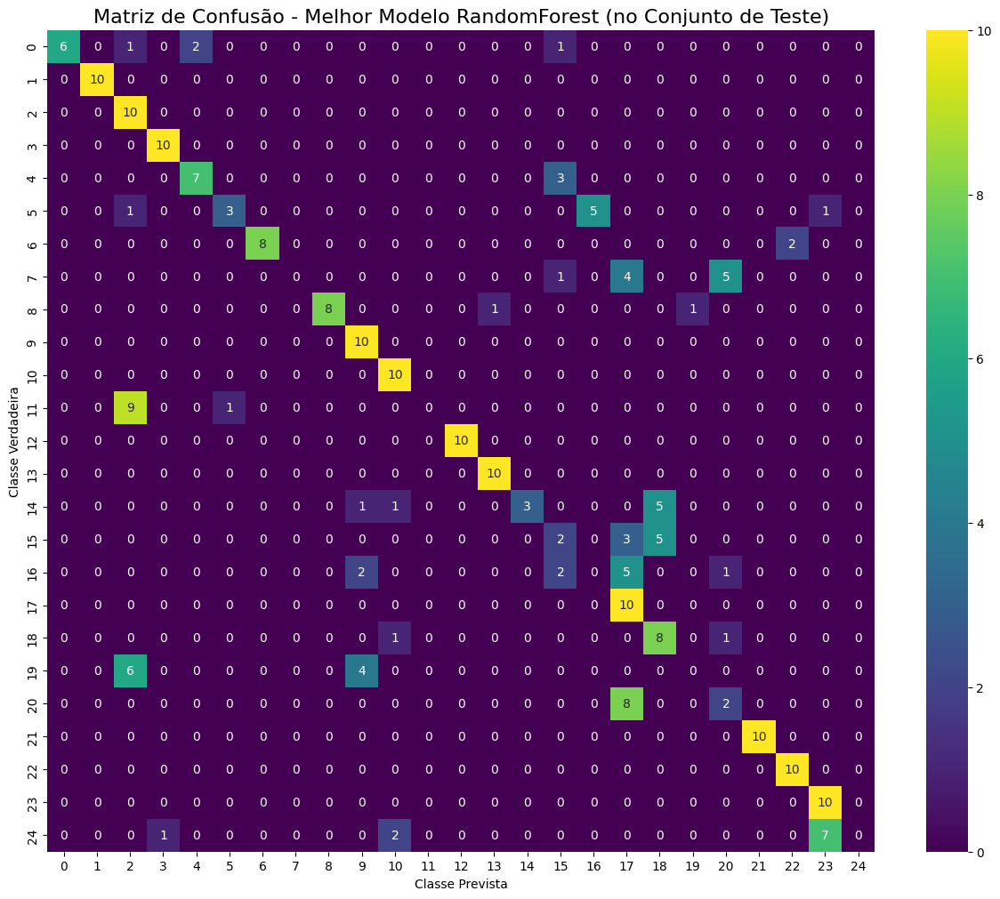

In [47]:
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt


print("--- Avaliação Final do Melhor Modelo no Conjunto de Teste ---")

# # 1. Treinar o melhor modelo com os 90% de dados de treino
# # (Mesmo que o GridSearchCV já o tenha treinado, é uma boa prática retreiná-lo com todos os dados de treino)
# best_rf_model.fit(X_treino, y_treino)

# 2. Fazer previsões UMA VEZ no conjunto de teste (10%)
y_pred_final = best_rf_model.predict(X_teste)

# 3. Calcular as métricas gerais
acc_final_rf = accuracy_score(y_teste, y_pred_final)
f1_final_rf = f1_score(y_teste, y_pred_final, average='weighted')

print(f"\nAcurácia Final no Teste: {acc_final_rf:.4f}")
print(f"F1-médio Final no Teste: {f1_final_rf:.4f}\n")

# 4. Exibir o relatório de classificação detalhado
print("--- Relatório de Classificação Final no Teste ---")
nomes_classes = encoder.classes_
print(classification_report(y_teste, y_pred_final, target_names=nomes_classes))

# 5. Plotar a Matriz de Confusão
cm_final = confusion_matrix(y_teste, y_pred_final)
plt.figure(figsize=(15, 12))
sns.heatmap(cm_final, annot=True, fmt='d', cmap='viridis')
plt.title('Matriz de Confusão - Melhor Modelo RandomForest (no Conjunto de Teste)', fontsize=16)
plt.ylabel('Classe Verdadeira')
plt.xlabel('Classe Prevista')
plt.show()

## Knn

In [ ]:
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# --- 1. Preparar os grupos APENAS para o conjunto de treino ---
# O train_index foi gerado na célula de divisão 90/10
grupos_treino = grupos.iloc[train_index]

# --- 2. Padronização dos Dados
pipeline_knn = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_jobs=-1))
])

# --- 3. Definir a Estratégia de Validação Cruzada  ---
sgkf_busca = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)

# --- 4. Definição da Grade de Parâmetros para o K-NN ---
param_grid_knn = {
    'knn__n_neighbors': [3, 5, 7, 9],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

# --- 5. Configuração e Execução do GridSearchCV ---
# useu o pipeline como estimador
grid_search_knn = GridSearchCV(estimator=pipeline_knn, param_grid=param_grid_knn, cv=sgkf_busca,
                               scoring='f1_weighted', n_jobs=-1, verbose=2)

print("Iniciando a busca pelos melhores hiperparâmetros para o K-NN (apenas nos 90% de treino)...")


grid_search_knn.fit(X_treino, y_treino, groups=grupos_treino)

# --- 6. Exibição dos Resultados ---
print("\nBusca finalizada!")
print("Melhores parâmetros encontrados para o K-NN:", grid_search_knn.best_params_)
print(f"Melhor F1-score na validação cruzada (dentro do treino): {grid_search_knn.best_score_:.4f}")

# Guardar o melhor modelo K-NN encontrado
best_knn_model = grid_search_knn.best_estimator_

Iniciando a busca pelos melhores hiperparâmetros para o K-NN (apenas nos 90% de treino)...
Fitting 5 folds for each of 16 candidates, totalling 80 fits

Busca finalizada!
Melhores parâmetros encontrados para o K-NN: {'knn__metric': 'manhattan', 'knn__n_neighbors': 3, 'knn__weights': 'distance'}
Melhor F1-score na validação cruzada (dentro do treino): 0.2538


### Aplicando melhor modelo

--- Avaliação Final do Melhor Modelo K-NN no Conjunto de Teste (10%) ---

Acurácia Final no Teste: 0.3760
F1-médio Final no Teste: 0.3383

--- Relatório de Classificação Final no Teste ---
                  precision    recall  f1-score   support

          Adicao       0.50      0.10      0.17        10
           Aluno       1.00      0.20      0.33        10
          Angulo       0.19      0.70      0.30        10
    Antropologia       0.62      0.80      0.70        10
       Apontador       0.46      0.60      0.52        10
        Apostila       0.67      0.20      0.31        10
        Biologia       1.00      0.80      0.89        10
Bolsa_de_Estudos       0.00      0.00      0.00        10
        Capitulo       0.50      0.60      0.55        10
          Classe       0.53      1.00      0.69        10
       Coerencia       0.36      0.50      0.42        10
          Coesao       0.00      0.00      0.00        10
          Colega       0.83      1.00      0.91        1

C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classi

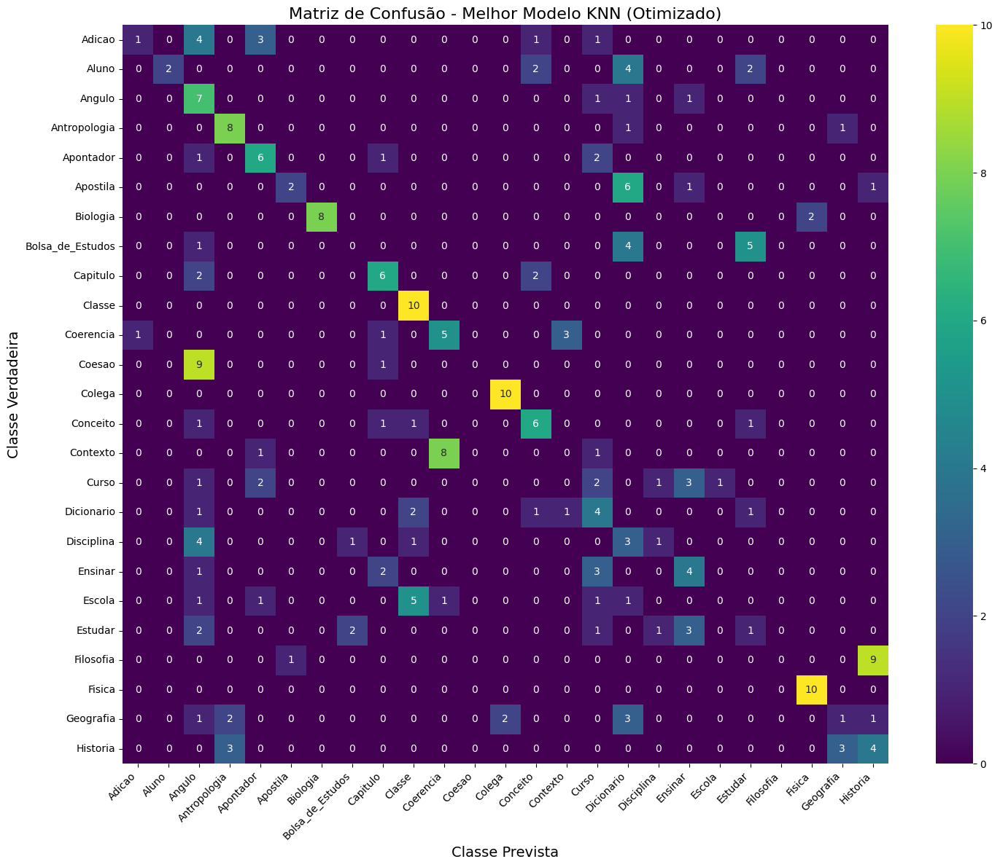

In [ ]:
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt



print("--- Avaliação Final do Melhor Modelo K-NN no Conjunto de Teste (10%) ---")

# 2. Fazer previsões no conjunto de teste
y_pred_final = best_knn_model.predict(X_teste)

# 3. Calcular as métricas gerais comparando as previsões com os rótulos do teste
acc_final_knn = accuracy_score(y_teste, y_pred_final)
f1_final_knn = f1_score(y_teste, y_pred_final, average='weighted')

print(f"\nAcurácia Final no Teste: {acc_final_knn:.4f}")
print(f"F1-médio Final no Teste: {f1_final_knn:.4f}\n")

# 4. Exibir o relatório de classificação detalhado
print("--- Relatório de Classificação Final no Teste ---")
nomes_classes = encoder.classes_
print(classification_report(y_teste, y_pred_final, target_names=nomes_classes))

# 5. Plotar a Matriz de Confusão
cm_final = confusion_matrix(y_teste, y_pred_final)
plt.figure(figsize=(15, 12))
sns.heatmap(cm_final, annot=True, fmt='d', cmap='viridis', # Cor diferente para o resultado final
            xticklabels=nomes_classes, yticklabels=nomes_classes)
plt.title('Matriz de Confusão - Melhor Modelo KNN (Otimizado)', fontsize=16)
plt.ylabel('Classe Verdadeira', fontsize=14)
plt.xlabel('Classe Prevista', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
# # Definição da Grade de Parâmetros  
# # param_grid = {
# #     'n_estimators': [100, 200],
# #     'max_depth': [10, 20, None],
# #     'min_samples_split': [2, 5],
# #     'min_samples_leaf': [1, 2]
# # }

## MLP - Multi-Layer Perceptron

In [41]:
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Supondo que X_treino, y_treino, e os grupos correspondentes já foram criados.

# --- 1. Preparar os grupos APENAS para o conjunto de treino ---
grupos_treino = grupos.iloc[train_index]

# --- 2. Criar um Pipeline com Padronização e o Modelo MLP ---
pipeline_mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPClassifier(random_state=42, max_iter=1000, n_iter_no_change=15))
])

# --- 3. Definir a Estratégia de Validação Cruzada (para a busca) ---
sgkf_busca = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)

# --- 4. Definição da Grade de Parâmetros para o MLP ---
# Os nomes dos parâmetros precisam do prefixo 'mlp__' por causa do pipeline
param_grid_mlp = {
    'mlp__hidden_layer_sizes': [(50, 50), (100,)],
    'mlp__activation': ['relu', 'tanh'],
    'mlp__alpha': [0.0001, 0.05],
}

# --- 5. Configuração e Execução do GridSearchCV ---
# Usamos o pipeline como estimador
grid_search_mlp = GridSearchCV(estimator=pipeline_mlp, param_grid=param_grid_mlp, cv=sgkf_busca,
                               scoring='f1_weighted', n_jobs=-1, verbose=2)

print("Iniciando a busca pelos melhores hiperparâmetros para o MLP (apenas nos 90% de treino)...")
# Usamos apenas os dados de TREINO aqui
grid_search_mlp.fit(X_treino, y_treino, groups=grupos_treino)

# --- 6. Exibição dos Resultados ---
print("\nBusca finalizada!")
print("Melhores parâmetros encontrados para o MLP:", grid_search_mlp.best_params_)
print(f"Melhor F1-score na validação cruzada (dentro do treino): {grid_search_mlp.best_score_:.4f}")

# Guardar o melhor modelo MLP encontrado
best_mlp_model = grid_search_mlp.best_estimator_

Iniciando a busca pelos melhores hiperparâmetros para o MLP (apenas nos 90% de treino)...
Fitting 5 folds for each of 8 candidates, totalling 40 fits

Busca finalizada!
Melhores parâmetros encontrados para o MLP: {'mlp__activation': 'tanh', 'mlp__alpha': 0.05, 'mlp__hidden_layer_sizes': (100,)}
Melhor F1-score na validação cruzada (dentro do treino): 0.3820


### Aplicando melhor modelo

--- Avaliação Final do Melhor Modelo MLP no Conjunto de Teste (10%) ---

Acurácia Final no Teste: 0.5360
F1-médio Final no Teste: 0.4984

--- Relatório de Classificação Final no Teste ---
                  precision    recall  f1-score   support

          Adicao       0.33      0.30      0.32        10
           Aluno       0.71      1.00      0.83        10
          Angulo       0.35      0.90      0.50        10
    Antropologia       1.00      0.90      0.95        10
       Apontador       1.00      0.30      0.46        10
        Apostila       0.00      0.00      0.00        10
        Biologia       0.70      0.70      0.70        10
Bolsa_de_Estudos       0.14      0.10      0.12        10
        Capitulo       1.00      0.40      0.57        10
          Classe       0.53      1.00      0.69        10
       Coerencia       0.90      0.90      0.90        10
          Coesao       0.00      0.00      0.00        10
          Colega       1.00      0.40      0.57        10

C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classi

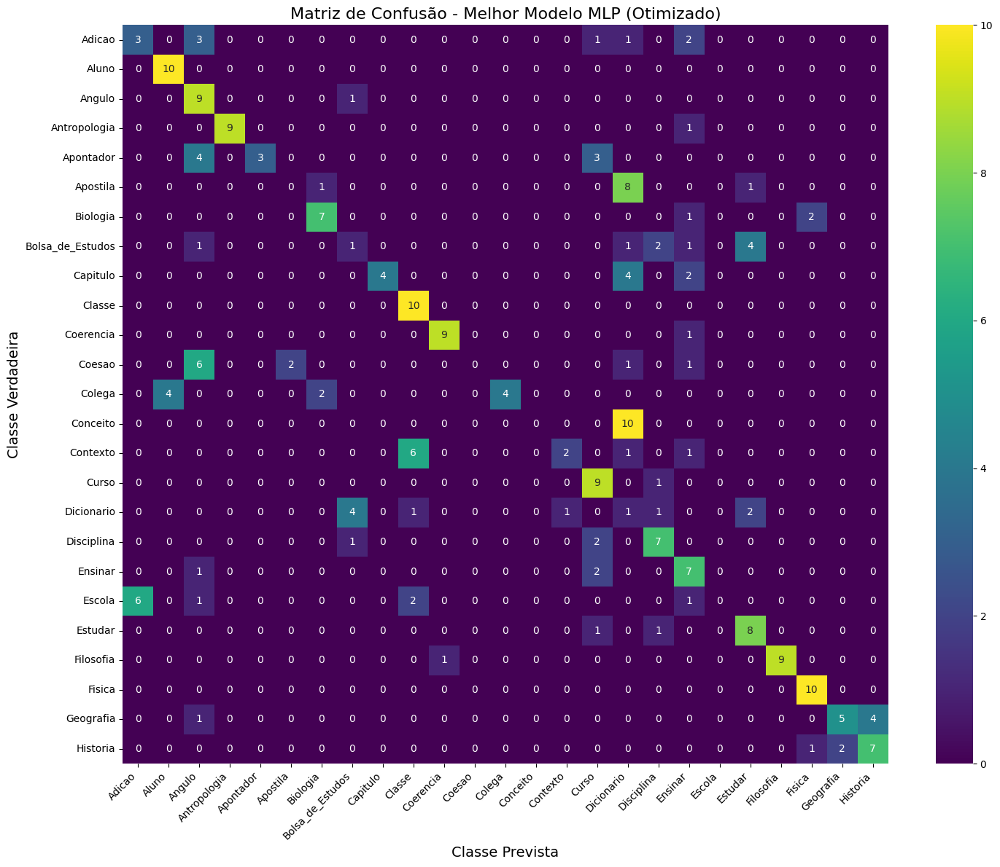

In [49]:
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt

print("--- Avaliação Final do Melhor Modelo MLP no Conjunto de Teste (10%) ---")

# 2. Fazer previsões no conjunto de teste
# O pipeline cuidará de padronizar os dados do X_teste antes de prever
y_pred_final = best_mlp_model.predict(X_teste)

# 3. Calcular as métricas gerais comparando as previsões com os rótulos do teste
acc_final_mlp = accuracy_score(y_teste, y_pred_final)
f1_final_mlp = f1_score(y_teste, y_pred_final, average='weighted')

print(f"\nAcurácia Final no Teste: {acc_final_mlp:.4f}")
print(f"F1-médio Final no Teste: {f1_final_mlp:.4f}\n")

# 4. Exibir o relatório de classificação detalhado
print("--- Relatório de Classificação Final no Teste ---")
nomes_classes = encoder.classes_
print(classification_report(y_teste, y_pred_final, target_names=nomes_classes))

# 5. Plotar a Matriz de Confusão
cm_final = confusion_matrix(y_teste, y_pred_final)
plt.figure(figsize=(15, 12))
sns.heatmap(cm_final, annot=True, fmt='d', cmap='viridis', # Cor diferente para o resultado final
            xticklabels=nomes_classes, yticklabels=nomes_classes)
plt.title('Matriz de Confusão - Melhor Modelo MLP (Otimizado)', fontsize=16)
plt.ylabel('Classe Verdadeira', fontsize=14)
plt.xlabel('Classe Prevista', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## Comparando

In [50]:
import pandas as pd

# Supondo que você salvou as pontuações finais de cada modelo em variáveis
# Ex: acc_final_rf, f1_final_rf, acc_final_knn, f1_final_knn, etc.
# Se os nomes das suas variáveis forem diferentes, apenas ajuste-os na lista abaixo.

# 1. Criar um dicionário com os resultados finais de cada modelo no conjunto de teste
resultados_finais = {
    'Modelo': ['Random Forest', 'K-NN', 'MLP'],
    f'Acurácia no Teste': [acc_final_rf, acc_final_knn, acc_final_mlp],
    f'F1-Score no Teste': [f1_final_rf, f1_final_knn, f1_final_mlp]
}

# 2. Converter o dicionário em um DataFrame do pandas
df_comparacao_final = pd.DataFrame(resultados_finais)

# 3. Ordenar o DataFrame pelo F1-score para ver facilmente qual foi o campeão
df_comparacao_final = df_comparacao_final.sort_values(by='F1-Score no Teste', ascending=False)

print("--- Tabela Comparativa Final (no Conjunto de Teste de 10%) ---")
display(df_comparacao_final)

--- Tabela Comparativa Final (no Conjunto de Teste de 10%) ---


,Modelo,Acurácia no Teste,F1-Score no Teste
0,Random Forest,0.628,0.571599
2,MLP,0.536,0.498440
1,K-NN,0.376,0.338336


# testando modelos sem o Z

In [79]:
df = pd.read_csv('keyframes_brutos2.csv', index_col=0)

In [80]:
sinais = pd.read_csv('sinais2.csv')

In [81]:
import pandas as pd
import numpy as np

def extrair_features_temporais(video_df, num_partes=10):
    """
    Processa um vídeo, o divide em partes e extrai média, desvio padrão e variância de cada parte.
    """
    # 1. Pivotar o vídeo para o formato [frame, features]
    pivot_video = video_df.pivot_table(
        index='frame_num', 
        columns='keypoint_id', 
        values=['x', 'y', 'visibility']
    )
    pivot_video.columns = [f'{col[1]}_{col[0]}' for col in pivot_video.columns]
    pivot_video.sort_index(inplace=True) # Garante a ordem dos frames

    # 2. Dividir os frames do vídeo em N partes iguais
    partes = np.array_split(pivot_video, num_partes)
    
    features_finais_video = []
    
    # 3. Calcular estatísticas para cada parte
    for i, parte in enumerate(partes):
        if parte.empty:
            continue # Pula partes vazias se o vídeo for muito curto
            
        # Calcular média, desvio padrão e variância
        mean_features = parte.mean().add_suffix(f'_p{i}_mean')
        std_features = parte.std().add_suffix(f'_p{i}_std')
        var_features = parte.var().add_suffix(f'_p{i}_var')
        
        features_finais_video.extend([mean_features, std_features, var_features])
    
    # 4. Concatenar todas as features de todas as partes em uma única linha (vetor)
    if not features_finais_video:
        return None 
    return pd.concat(features_finais_video)

# Aplicar a função a todos os vídeos 
print("Iniciando extração de características temporais...")

# Agrupar por vídeo e aplicar a função de extração
# .dropna() remove vídeos que eram muito curtos para gerar features
df_sem_Z = df.groupby('file_name').apply(lambda x: extrair_features_temporais(x)).dropna()

# Preenche NaNs que podem surgir do std/var de partes com um único frame
df_sem_Z.fillna(0, inplace=True)

print("Extração concluída!")
print(f"Shape do novo DataFrame de características: {df_sem_Z.shape}")
print(df_sem_Z.head())

Iniciando extração de características temporais...


C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds

Extração concluída!
Shape do novo DataFrame de características: (2499, 1440)
                   0_visibility_p0_mean  7_visibility_p0_mean  \
file_name                                                       
Adicao_AP_1.json                    1.0                   1.0   
Adicao_AP_10.json                   1.0                   1.0   
Adicao_AP_2.json                    1.0                   1.0   
Adicao_AP_3.json                    1.0                   1.0   
Adicao_AP_4.json                    1.0                   1.0   

                   8_visibility_p0_mean  9_visibility_p0_mean  \
file_name                                                       
Adicao_AP_1.json                    1.0                   1.0   
Adicao_AP_10.json                   1.0                   1.0   
Adicao_AP_2.json                    1.0                   1.0   
Adicao_AP_3.json                    1.0                   1.0   
Adicao_AP_4.json                    1.0                   1.0   

           

In [82]:
# Adiciona a coluna sinal (pega um valor único de cada vídeo)
df_sinais = df_keyframes.groupby('file_name')['sinal'].first()

# Junta no DataFrame final
df_sem_Z = df_sem_Z.join(df_sinais)

print(df_sem_Z.head())

                   0_visibility_p0_mean  7_visibility_p0_mean  \
file_name                                                       
Adicao_AP_1.json                    1.0                   1.0   
Adicao_AP_10.json                   1.0                   1.0   
Adicao_AP_2.json                    1.0                   1.0   
Adicao_AP_3.json                    1.0                   1.0   
Adicao_AP_4.json                    1.0                   1.0   

                   8_visibility_p0_mean  9_visibility_p0_mean  \
file_name                                                       
Adicao_AP_1.json                    1.0                   1.0   
Adicao_AP_10.json                   1.0                   1.0   
Adicao_AP_2.json                    1.0                   1.0   
Adicao_AP_3.json                    1.0                   1.0   
Adicao_AP_4.json                    1.0                   1.0   

                   10_visibility_p0_mean  11_visibility_p0_mean  \
file_name            

In [83]:
# salvar o DataFrame em um arquivo CSV
df_sem_Z.to_csv('features_temporais_sem_Z2.csv', index=True)

In [84]:
df_sem_Z = pd.read_csv('features_temporais_sem_Z2.csv', index_col=0)

In [65]:
sinais = pd.read_csv('sinais2.csv')

## dividindo x e Y

In [ ]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd

print("--- Separando Características (X), Rótulo (y) e Grupos (Método Robusto) ---")


# 1. Criar dicionários de mapeamento a partir do DataFrame 'sinais' original
sinal_map = sinais.set_index('file_name')['sinal'].to_dict()
interprete_map = sinais.set_index('file_name')['interprete'].to_dict()

# 2. Garantir que 'file_name' é uma coluna no DataFrame de features
if 'file_name' not in df_sem_Z.columns:
    df_sem_Z.reset_index(inplace=True)

# 3. Criar o DataFrame final e adicionar as colunas 'sinal' e 'interprete' usando o .map()
df_final = df_sem_Z.copy()
df_final['sinal'] = df_final['file_name'].map(sinal_map)
df_final['interprete'] = df_final['file_name'].map(interprete_map)

# -----------------------------------------------------------

# --- Etapa de segurança ---
# Verificar se o mapeamento criou valores nulos e removê-los
if df_final['sinal'].isnull().any():
    print(f"Aviso: {df_final['sinal'].isnull().sum()} linhas não encontraram um 'sinal' correspondente e serão removidas.")
    df_final.dropna(subset=['sinal'], inplace=True)

# --- O resto do seu código continua o mesmo ---

# Criar a variável de rótulos (y) e codificá-la
encoder = LabelEncoder()
y = encoder.fit_transform(df_final['sinal'])
labels = encoder.classes_

# Definir os grupos
groups = df_final['interprete']

# Definir o X (características)
colunas_para_remover = ['file_name', 'sinal', 'interprete']
X = df_final.drop(columns=colunas_para_remover)

print("\nSeparação concluída!")
print(f"Shape de X (características): {X.shape}")
print(f"Shape de y (rótulos): {y.shape}")
print(f"Shape de groups: {groups.shape}")

--- Separando Características (X), Rótulo (y) e Grupos (Método Robusto) ---

Separação concluída!
Shape de X (características): (2499, 1440)
Shape de y (rótulos): (2499,)
Shape de groups: (2499,)


In [90]:
from sklearn.model_selection import StratifiedGroupKFold

print("--- Iniciando a Divisão dos Dados em 90/10 ---")

# 1. Configurar o StratifiedGroupKFold
sgkf = StratifiedGroupKFold(n_splits=10, shuffle=True, random_state=42)

# 2. Pegar os índices da primeira divisão
train_index, test_index = next(sgkf.split(X, y, groups=grupos))

# 3. Criar os conjuntos de treino e teste finais usando .iloc
# CORREÇÃO AQUI:
X_treino, X_teste = X.iloc[train_index], X.iloc[test_index]
y_treino, y_teste = y[train_index], y[test_index]

# 4. Verificação
total_amostras = len(X)
treino_percent = len(X_treino) / total_amostras * 100
teste_percent = len(X_teste) / total_amostras * 100

print("\nDados divididos com sucesso!")
print(f"Formato do X_treino: {X_treino.shape} ({treino_percent:.1f}%)")
print(f"Formato do X_teste: {X_teste.shape} ({teste_percent:.1f}%)")

--- Iniciando a Divisão dos Dados em 90/10 ---

Dados divididos com sucesso!
Formato do X_treino: (2249, 1440) (90.0%)
Formato do X_teste: (250, 1440) (10.0%)


## Random Forest 

In [91]:
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# --- 1. Preparar os grupos APENAS para o conjunto de treino ---
# O train_index foi gerado na célula de divisão 90/10
grupos_treino = grupos.iloc[train_index]

# --- 2. Definir a Estratégia de Validação Cruzada (para a busca) ---
# Esta validação cruzada acontecerá DENTRO dos 90% de treino
sgkf_busca = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)

# --- 3. Definir a Grade de Parâmetros ---
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 30],
    'min_samples_split': [2, 5]
}

# --- 4. Configurar e Executar o GridSearchCV ---
rf_model = RandomForestClassifier(random_state=42, n_jobs=-1)

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=sgkf_busca,
                           scoring='f1_weighted', n_jobs=-1, verbose=2)

print("\nIniciando a busca pelos melhores hiperparâmetros (apenas nos 90% de treino)...")
# Usamos apenas os dados de TREINO aqui
grid_search.fit(X_treino, y_treino, groups=grupos_treino)

# --- 5. Exibir e Salvar o Melhor Modelo ---
print("\nBusca finalizada!")
print("Melhores parâmetros encontrados:", grid_search.best_params_)
print(f"Melhor F1-score na validação cruzada (dentro do treino): {grid_search.best_score_:.4f}")

best_rf_model = grid_search.best_estimator_


Iniciando a busca pelos melhores hiperparâmetros (apenas nos 90% de treino)...
Fitting 5 folds for each of 8 candidates, totalling 40 fits

Busca finalizada!
Melhores parâmetros encontrados: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 200}
Melhor F1-score na validação cruzada (dentro do treino): 0.4564


### Aplicando melhor modelo

--- Avaliação Final do Melhor Modelo no Conjunto de Teste ---

Acurácia Final no Teste: 0.6600
F1-médio Final no Teste: 0.6129

--- Relatório de Classificação Final no Teste ---
                  precision    recall  f1-score   support

          Adicao       1.00      0.80      0.89        10
           Aluno       1.00      1.00      1.00        10
          Angulo       0.36      1.00      0.53        10
    Antropologia       0.91      1.00      0.95        10
       Apontador       0.64      0.70      0.67        10
        Apostila       0.73      0.80      0.76        10
        Biologia       1.00      0.90      0.95        10
Bolsa_de_Estudos       0.25      0.10      0.14        10
        Capitulo       1.00      0.70      0.82        10
          Classe       0.71      1.00      0.83        10
       Coerencia       0.77      1.00      0.87        10
          Coesao       0.00      0.00      0.00        10
          Colega       1.00      1.00      1.00        10
        C

C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classi

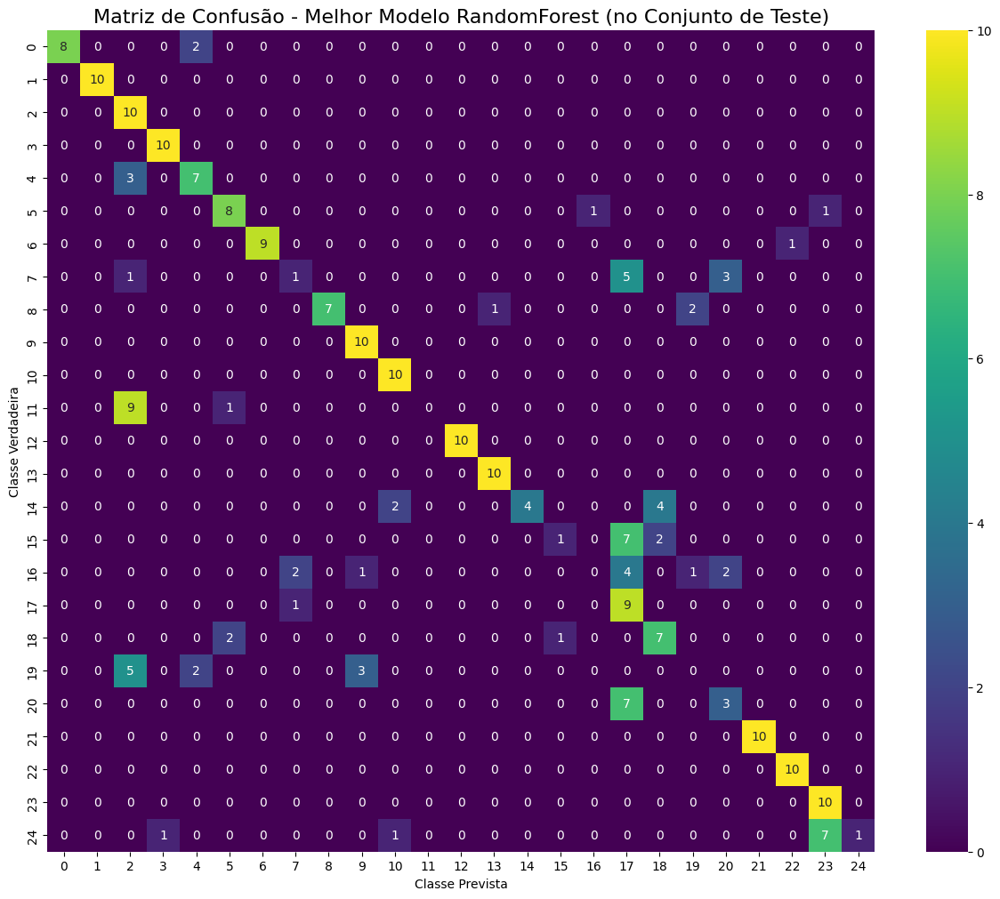

In [92]:
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt


print("--- Avaliação Final do Melhor Modelo no Conjunto de Teste ---")

# # 1. Treinar o melhor modelo com os 90% de dados de treino
# # (Mesmo que o GridSearchCV já o tenha treinado, é uma boa prática retreiná-lo com todos os dados de treino)
# best_rf_model.fit(X_treino, y_treino)

# 2. Fazer previsões UMA VEZ no conjunto de teste (10%)
y_pred_final = best_rf_model.predict(X_teste)

# 3. Calcular as métricas gerais
acc_final_rf = accuracy_score(y_teste, y_pred_final)
f1_final_rf = f1_score(y_teste, y_pred_final, average='weighted')

print(f"\nAcurácia Final no Teste: {acc_final_rf:.4f}")
print(f"F1-médio Final no Teste: {f1_final_rf:.4f}\n")

# 4. Exibir o relatório de classificação detalhado
print("--- Relatório de Classificação Final no Teste ---")
nomes_classes = encoder.classes_
print(classification_report(y_teste, y_pred_final, target_names=nomes_classes))

# 5. Plotar a Matriz de Confusão
cm_final = confusion_matrix(y_teste, y_pred_final)
plt.figure(figsize=(15, 12))
sns.heatmap(cm_final, annot=True, fmt='d', cmap='viridis')
plt.title('Matriz de Confusão - Melhor Modelo RandomForest (no Conjunto de Teste)', fontsize=16)
plt.ylabel('Classe Verdadeira')
plt.xlabel('Classe Prevista')
plt.show()

## knn


In [93]:
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# --- 1. Preparar os grupos APENAS para o conjunto de treino ---
# O train_index foi gerado na célula de divisão 90/10
grupos_treino = grupos.iloc[train_index]

# --- 2. Padronização dos Dados
pipeline_knn = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsClassifier(n_jobs=-1))
])

# --- 3. Definir a Estratégia de Validação Cruzada  ---
sgkf_busca = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)

# --- 4. Definição da Grade de Parâmetros para o K-NN ---
param_grid_knn = {
    'knn__n_neighbors': [3, 5, 7, 9],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

# --- 5. Configuração e Execução do GridSearchCV ---
# useu o pipeline como estimador
grid_search_knn = GridSearchCV(estimator=pipeline_knn, param_grid=param_grid_knn, cv=sgkf_busca,
                               scoring='f1_weighted', n_jobs=-1, verbose=2)

print("Iniciando a busca pelos melhores hiperparâmetros para o K-NN (apenas nos 90% de treino)...")


grid_search_knn.fit(X_treino, y_treino, groups=grupos_treino)

# --- 6. Exibição dos Resultados ---
print("\nBusca finalizada!")
print("Melhores parâmetros encontrados para o K-NN:", grid_search_knn.best_params_)
print(f"Melhor F1-score na validação cruzada (dentro do treino): {grid_search_knn.best_score_:.4f}")

# Guardar o melhor modelo K-NN encontrado
best_knn_model = grid_search_knn.best_estimator_

Iniciando a busca pelos melhores hiperparâmetros para o K-NN (apenas nos 90% de treino)...
Fitting 5 folds for each of 16 candidates, totalling 80 fits

Busca finalizada!
Melhores parâmetros encontrados para o K-NN: {'knn__metric': 'manhattan', 'knn__n_neighbors': 3, 'knn__weights': 'distance'}
Melhor F1-score na validação cruzada (dentro do treino): 0.2700


### Aplicando melhor modelo

--- Avaliação Final do Melhor Modelo K-NN no Conjunto de validação (10%) ---

Acurácia Final no Teste: 0.3920
F1-médio Final no Teste: 0.3646

--- Relatório de Classificação Final no Teste ---
                  precision    recall  f1-score   support

          Adicao       1.00      0.40      0.57        10
           Aluno       1.00      0.40      0.57        10
          Angulo       0.19      1.00      0.32        10
    Antropologia       0.67      0.60      0.63        10
       Apontador       0.00      0.00      0.00        10
        Apostila       0.50      0.10      0.17        10
        Biologia       1.00      1.00      1.00        10
Bolsa_de_Estudos       0.00      0.00      0.00        10
        Capitulo       0.80      0.40      0.53        10
          Classe       0.83      1.00      0.91        10
       Coerencia       0.07      0.10      0.08        10
          Coesao       0.00      0.00      0.00        10
          Colega       0.56      1.00      0.71     

C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classi

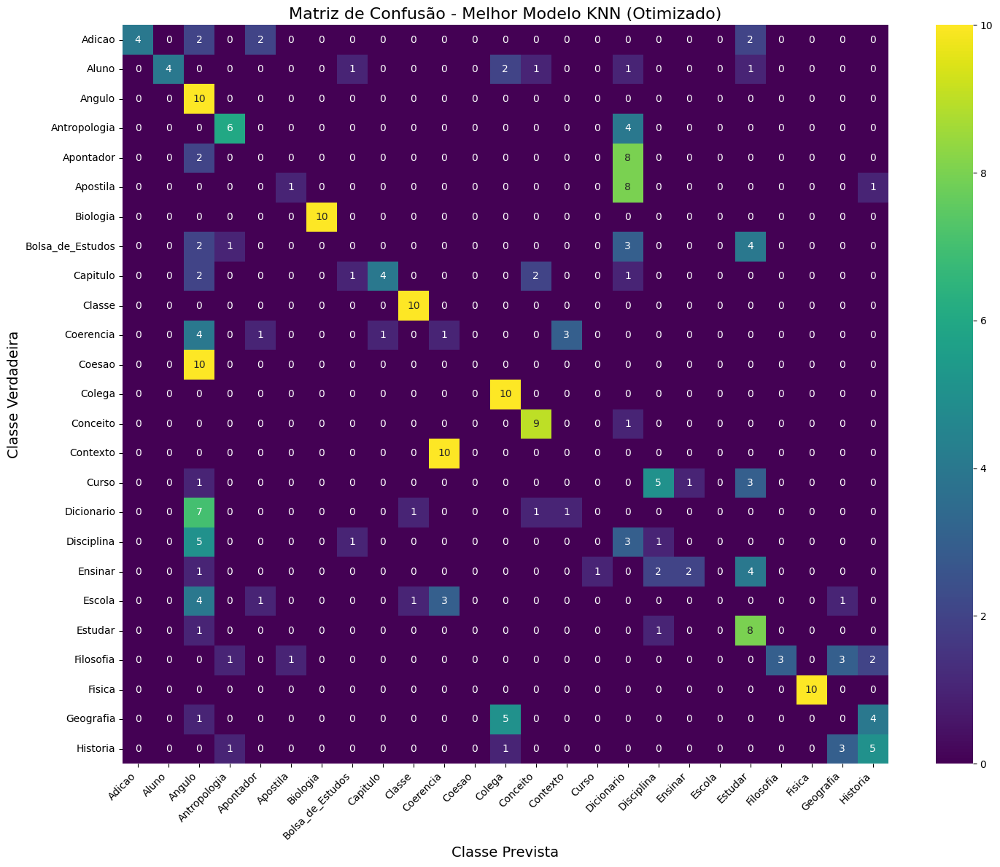

In [94]:
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt



print("--- Avaliação Final do Melhor Modelo K-NN no Conjunto de validação (10%) ---")

# 2. Fazer previsões no conjunto de teste
y_pred_final = best_knn_model.predict(X_teste)

# 3. Calcular as métricas gerais comparando as previsões com os rótulos do teste
acc_final_knn = accuracy_score(y_teste, y_pred_final)
f1_final_knn = f1_score(y_teste, y_pred_final, average='weighted')

print(f"\nAcurácia Final no Teste: {acc_final_knn:.4f}")
print(f"F1-médio Final no Teste: {f1_final_knn:.4f}\n")

# 4. Exibir o relatório de classificação detalhado
print("--- Relatório de Classificação Final no Teste ---")
nomes_classes = encoder.classes_
print(classification_report(y_teste, y_pred_final, target_names=nomes_classes))

# 5. Plotar a Matriz de Confusão
cm_final = confusion_matrix(y_teste, y_pred_final)
plt.figure(figsize=(15, 12))
sns.heatmap(cm_final, annot=True, fmt='d', cmap='viridis', # Cor diferente para o resultado final
            xticklabels=nomes_classes, yticklabels=nomes_classes)
plt.title('Matriz de Confusão - Melhor Modelo KNN (Otimizado)', fontsize=16)
plt.ylabel('Classe Verdadeira', fontsize=14)
plt.xlabel('Classe Prevista', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## MLP

In [95]:
from sklearn.model_selection import StratifiedGroupKFold, GridSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# --- 1. Preparar os grupos APENAS para o conjunto de treino ---
grupos_treino = grupos.iloc[train_index]

# --- 2. Criar um Pipeline com Padronização e o Modelo MLP ---
pipeline_mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPClassifier(random_state=42, max_iter=1000, n_iter_no_change=15))
])

# --- 3. Definir a Estratégia de Validação Cruzada (para a busca) ---
sgkf_busca = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)

# --- 4. Definição da Grade de Parâmetros para o MLP ---
# Os nomes dos parâmetros precisam do prefixo 'mlp__' por causa do pipeline
param_grid_mlp = {
    'mlp__hidden_layer_sizes': [(50, 50), (100,)],
    'mlp__activation': ['relu', 'tanh'],
    'mlp__alpha': [0.0001, 0.05],
}

# --- 5. Configuração e Execução do GridSearchCV ---
# Usamos o pipeline como estimador
grid_search_mlp = GridSearchCV(estimator=pipeline_mlp, param_grid=param_grid_mlp, cv=sgkf_busca,
                               scoring='f1_weighted', n_jobs=-1, verbose=2)

print("Iniciando a busca pelos melhores hiperparâmetros para o MLP (apenas nos 90% de treino)...")
# Usamos apenas os dados de TREINO aqui
grid_search_mlp.fit(X_treino, y_treino, groups=grupos_treino)

# --- 6. Exibição dos Resultados ---
print("\nBusca finalizada!")
print("Melhores parâmetros encontrados para o MLP:", grid_search_mlp.best_params_)
print(f"Melhor F1-score na validação cruzada (dentro do treino): {grid_search_mlp.best_score_:.4f}")

# Guardar o melhor modelo MLP encontrado
best_mlp_model = grid_search_mlp.best_estimator_

Iniciando a busca pelos melhores hiperparâmetros para o MLP (apenas nos 90% de treino)...
Fitting 5 folds for each of 8 candidates, totalling 40 fits

Busca finalizada!
Melhores parâmetros encontrados para o MLP: {'mlp__activation': 'tanh', 'mlp__alpha': 0.05, 'mlp__hidden_layer_sizes': (100,)}
Melhor F1-score na validação cruzada (dentro do treino): 0.4023


### Aplicando melhor modelo

--- Avaliação Final do Melhor Modelo MLP no Conjunto de Teste (10%) ---

Acurácia Final no Teste: 0.4680
F1-médio Final no Teste: 0.4371

--- Relatório de Classificação Final no Teste ---
                  precision    recall  f1-score   support

          Adicao       0.67      0.20      0.31        10
           Aluno       0.62      1.00      0.77        10
          Angulo       0.20      0.90      0.33        10
    Antropologia       1.00      0.90      0.95        10
       Apontador       1.00      0.20      0.33        10
        Apostila       0.00      0.00      0.00        10
        Biologia       0.89      0.80      0.84        10
Bolsa_de_Estudos       0.15      0.20      0.17        10
        Capitulo       0.83      0.50      0.62        10
          Classe       0.48      1.00      0.65        10
       Coerencia       0.91      1.00      0.95        10
          Coesao       0.00      0.00      0.00        10
          Colega       1.00      0.40      0.57        10

C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\augusto\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classi

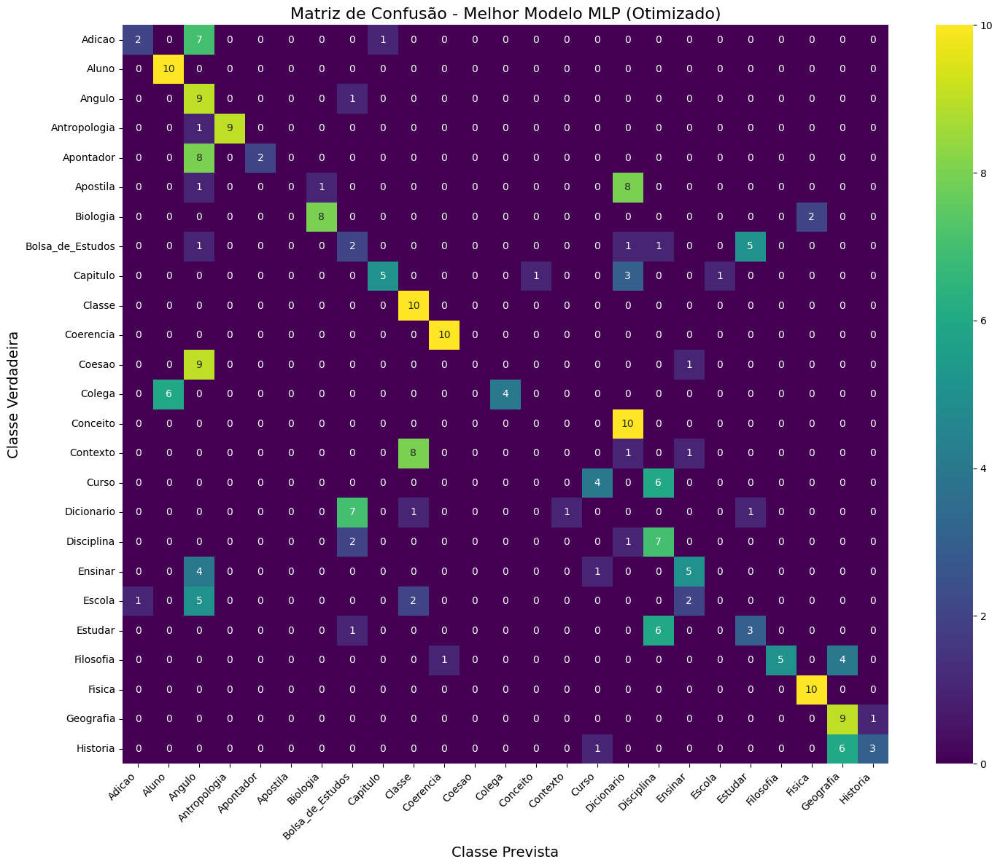

In [96]:
%matplotlib inline
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt

print("--- Avaliação Final do Melhor Modelo MLP no Conjunto de Teste (10%) ---")

# 2. Fazer previsões no conjunto de teste
# O pipeline cuidará de padronizar os dados do X_teste antes de prever
y_pred_final = best_mlp_model.predict(X_teste)

# 3. Calcular as métricas gerais comparando as previsões com os rótulos do teste
acc_final_mlp = accuracy_score(y_teste, y_pred_final)
f1_final_mlp = f1_score(y_teste, y_pred_final, average='weighted')

print(f"\nAcurácia Final no Teste: {acc_final_mlp:.4f}")
print(f"F1-médio Final no Teste: {f1_final_mlp:.4f}\n")

# 4. Exibir o relatório de classificação detalhado
print("--- Relatório de Classificação Final no Teste ---")
nomes_classes = encoder.classes_
print(classification_report(y_teste, y_pred_final, target_names=nomes_classes))

# 5. Plotar a Matriz de Confusão
cm_final = confusion_matrix(y_teste, y_pred_final)
plt.figure(figsize=(15, 12))
sns.heatmap(cm_final, annot=True, fmt='d', cmap='viridis', # Cor diferente para o resultado final
            xticklabels=nomes_classes, yticklabels=nomes_classes)
plt.title('Matriz de Confusão - Melhor Modelo MLP (Otimizado)', fontsize=16)
plt.ylabel('Classe Verdadeira', fontsize=14)
plt.xlabel('Classe Prevista', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## comparando os modelos

In [97]:
import pandas as pd

# 1. Criar um dicionário com os resultados de cada modelo
resultados = {
    'Modelo': ['Random Forest', 'K-NN', 'MLP'],
    'Melhor F1-Score': [
        grid_search.best_score_,
        grid_search_knn.best_score_,
        grid_search_mlp.best_score_
    ],
    'Melhores Parâmetros': [
        str(grid_search.best_params_),
        str(grid_search_knn.best_params_),
        str(grid_search_mlp.best_params_)
    ]
}

# Converter o dicionário em um DataFrame do pandas para uma visualização clara
df_comparacao = pd.DataFrame(resultados)

#  Ordenar o DataFrame pelo F1-score para ver facilmente qual foi o melhor
df_comparacao = df_comparacao.sort_values(by='Melhor F1-Score', ascending=False)

print("--- Tabela Comparativa dos Modelos Otimizados ---")
display(df_comparacao)

--- Tabela Comparativa dos Modelos Otimizados ---


,Modelo,Melhor F1-Score,Melhores Parâmetros
0,Random Forest,0.456394,"{'max_depth': 30, 'min_samples_split': 2, 'n_e..."
2,MLP,0.402277,"{'mlp__activation': 'tanh', 'mlp__alpha': 0.05..."
1,K-NN,0.269986,"{'knn__metric': 'manhattan', 'knn__n_neighbors..."


In [98]:
import pandas as pd

# Supondo que você salvou as pontuações finais de cada modelo em variáveis
# Ex: acc_final_rf, f1_final_rf, acc_final_knn, f1_final_knn, etc.
# Se os nomes das suas variáveis forem diferentes, apenas ajuste-os na lista abaixo.

# 1. Criar um dicionário com os resultados finais de cada modelo no conjunto de teste
resultados_finais = {
    'Modelo': ['Random Forest', 'K-NN', 'MLP'],
    f'Acurácia no Teste': [acc_final_rf, acc_final_knn, acc_final_mlp],
    f'F1-Score no Teste': [f1_final_rf, f1_final_knn, f1_final_mlp]
}

# 2. Converter o dicionário em um DataFrame do pandas
df_comparacao_final = pd.DataFrame(resultados_finais)

# 3. Ordenar o DataFrame pelo F1-score para ver facilmente qual foi o campeão
df_comparacao_final = df_comparacao_final.sort_values(by='F1-Score no Teste', ascending=False)

print("--- Tabela Comparativa Final (no Conjunto de Teste de 10%) ---")
display(df_comparacao_final)

--- Tabela Comparativa Final (no Conjunto de Teste de 10%) ---


,Modelo,Acurácia no Teste,F1-Score no Teste
0,Random Forest,0.660,0.612895
2,MLP,0.468,0.437147
1,K-NN,0.392,0.364615


# Parte 2


In [101]:
import pandas as pd
df_features = pd.read_csv('features_temporais2.csv', index_col=0)
sinais = pd.read_csv('sinais2.csv')

In [3]:
df_features.head()

,11_visibility_p0_mean,12_visibility_p0_mean,13_visibility_p0_mean,14_visibility_p0_mean,15_visibility_p0_mean,16_visibility_p0_mean,17_visibility_p0_mean,18_visibility_p0_mean,19_visibility_p0_mean,20_visibility_p0_mean,...,13_z_p9_var,14_z_p9_var,15_z_p9_var,16_z_p9_var,17_z_p9_var,18_z_p9_var,19_z_p9_var,20_z_p9_var,21_z_p9_var,sinal
file_name,,,,,,,,,,,,,,,,,,,,,
Adicao_AP_1.json,1.0,1.0,1.00,1.000,0.971333,0.976000,0.916000,0.932000,0.922000,0.939333,...,0.000213,0.000288,0.000767,0.000726,0.000890,0.000760,0.000873,0.000715,0.000702,Adicao
Adicao_AP_10.json,1.0,1.0,1.00,1.000,0.975000,0.980000,0.926429,0.936429,0.931429,0.942143,...,0.000106,0.000123,0.000126,0.000792,0.000206,0.000931,0.000208,0.000926,0.000131,Adicao
Adicao_AP_2.json,1.0,1.0,1.00,1.000,0.977857,0.970000,0.930000,0.918571,0.933571,0.923571,...,0.000276,0.000991,0.001841,0.003360,0.002076,0.004341,0.002324,0.004456,0.001892,Adicao
Adicao_AP_3.json,1.0,1.0,0.99,0.994,0.965333,0.957333,0.906667,0.895333,0.915333,0.905333,...,0.000319,0.000253,0.000484,0.000702,0.000526,0.000853,0.000594,0.000846,0.000407,Adicao
Adicao_AP_4.json,1.0,1.0,1.00,1.000,0.980000,0.973571,0.940000,0.932857,0.942143,0.941429,...,0.000677,0.000767,0.002244,0.002664,0.002977,0.003006,0.002964,0.003573,0.002440,Adicao


In [100]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd


print("    Separando Características (X), Rótulo (y) e Grupos   ")

# Para garantir que temos a coluna 'interprete' para os grupos, 
# vamos buscá-la no DataFrame 'sinais' original.
# Primeiro, garantimos que 'file_name' é uma coluna em df_features
if 'file_name' not in df_features.columns:
    df_features.reset_index(inplace=True)

info_df = sinais[['file_name', 'interprete']].drop_duplicates()
df_final = df_features.merge(info_df, on='file_name', how='left')


# Criar a variável de rótulos (y) a partir da coluna 'sinal' e codificá-la
encoder = LabelEncoder()
y = encoder.fit_transform(df_final['sinal'])
labels = encoder.classes_ # Guardar os nomes das classes para os gráficos

# Definir os grupos
groups = df_final['interprete']

# Definir o X (características) removendo todas as colunas de metadados
colunas_para_remover = ['file_name', 'sinal', 'interprete']
X = df_final.drop(columns=colunas_para_remover)

print("Separação concluída!")
print(f"Shape de X (características): {X.shape}")
print(f"Shape de y (rótulos): {y.shape}")
print(f"Shape de groups: {groups.shape}")

    Separando Características (X), Rótulo (y) e Grupos   
Separação concluída!
Shape de X (características): (2499, 1320)
Shape de y (rótulos): (2499,)
Shape de groups: (2499,)


## K-means

--- Preparando os Dados para Clusterização ---
Calculando a inércia para diferentes valores de K...


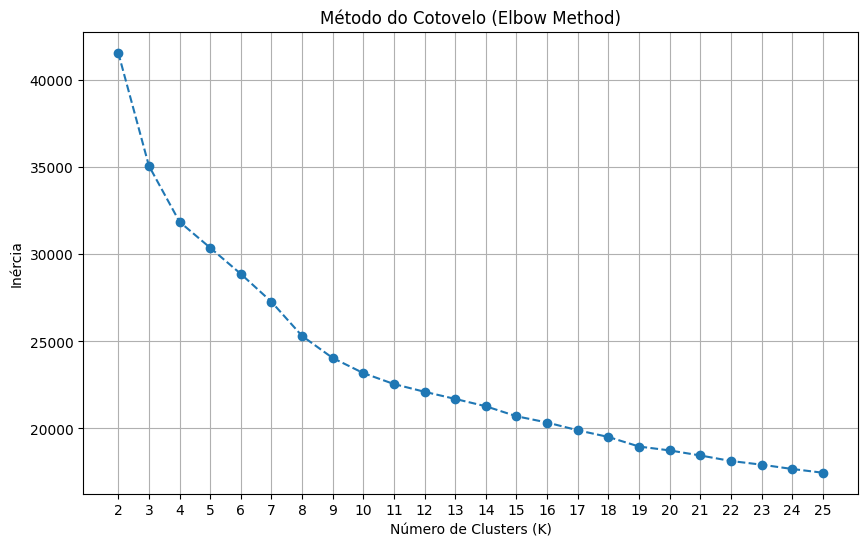

In [102]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pandas as pd


print("--- Preparando os Dados para Clusterização ---")
# Garantir que estamos usando apenas os dados numéricos
X_cluster = X.select_dtypes(include=['float64', 'int64'])


# Lista para armazenar os valores da inércia para cada valor de K
inercia = []
# Faixa de valores de K que vamos testar
k_range = range(2, 26) # Testaremos de 2 a 26 clusters

print("Calculando a inércia para diferentes valores de K...")
for k in k_range:
    # Cria e treina o modelo K-Means
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_cluster)
    
    # Armazena a inércia do modelo treinado
    inercia.append(kmeans.inertia_)

# Plotar o Gráfico do Cotovelo ---
plt.figure(figsize=(10, 6))
plt.plot(k_range, inercia, marker='o', linestyle='--')
plt.title('Método do Cotovelo (Elbow Method)')
plt.xlabel('Número de Clusters (K)')
plt.ylabel('Inércia')
plt.xticks(k_range)
plt.grid(True)
plt.show()

In [104]:
from sklearn.cluster import KMeans
import pandas as pd

# Definir o número de clusters ideal com base no gráfico do cotovelo
# testei com 18, 8, 6, 5 e 4 e 4 foi o que deu melhor resultado
k_ideal = 4

print(f"Aplicando o K-Means com k={k_ideal}...")

# Inicializar e treinar o modelo K-Means
kmeans_final = KMeans(n_clusters=k_ideal, random_state=42, n_init='auto')
kmeans_final.fit(X_cluster)

# Adicionar os rótulos dos clusters de volta ao DataFrame principal
# Isso nos permite ver a qual cluster cada vídeo pertence
df_features['kmeans_cluster'] = kmeans_final.labels_
df_features.reset_index(inplace=True)

print("\nClusterização com K-Means concluída!")
print("Amostra do DataFrame com a nova coluna de cluster:")

print(df_features[['file_name', 'kmeans_cluster']].head())

# Vamos ver quantos vídeos foram atribuídos a cada cluster
print("\nDistribuição dos vídeos por cluster:")
print(df_features['kmeans_cluster'].value_counts().sort_index())

Aplicando o K-Means com k=4...

Clusterização com K-Means concluída!
Amostra do DataFrame com a nova coluna de cluster:
           file_name  kmeans_cluster
0   Adicao_AP_1.json               3
1  Adicao_AP_10.json               3
2   Adicao_AP_2.json               3
3   Adicao_AP_3.json               3
4   Adicao_AP_4.json               3

Distribuição dos vídeos por cluster:
kmeans_cluster
0    892
1    402
2    590
3    615
Name: count, dtype: int64


Para k=4, o Score de Silhueta médio é: 0.1868

Reduzindo a dimensionalidade com PCA para visualização...
Gerando o gráfico dos clusters...


C:\Users\augusto\AppData\Local\Temp\ipykernel_10760\1232500583.py:28: UserWarning: The palette list has more values (18) than needed (4), which may not be intended.
  sns.scatterplot(


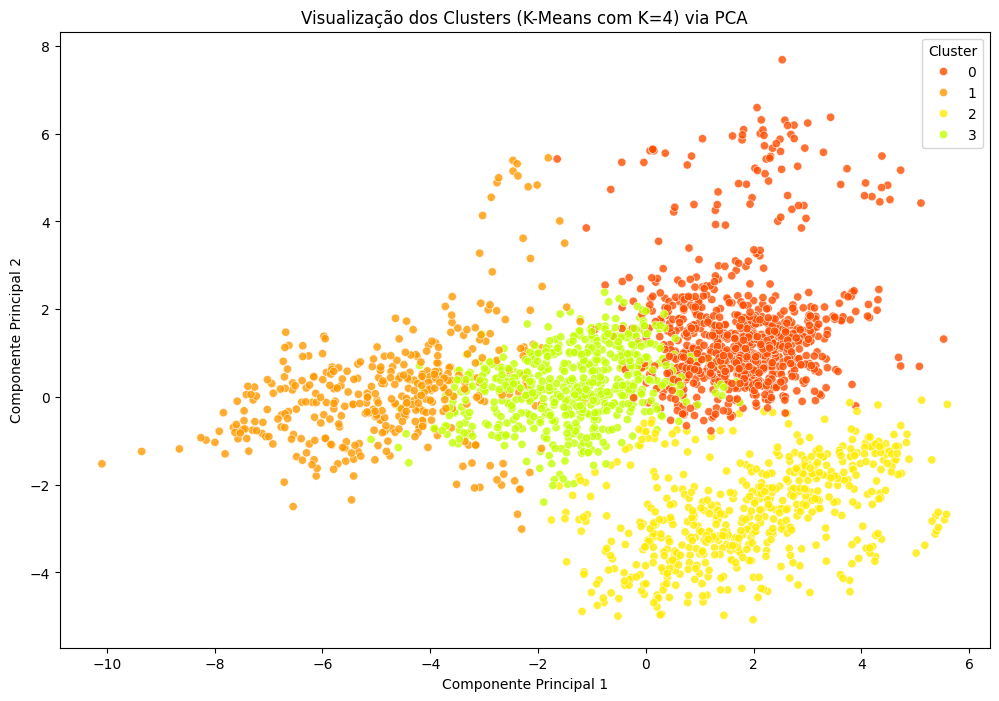

In [105]:
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Calcular o Score de Silhueta ---
# A métrica compara a distância média intra-cluster com a distância média inter-cluster.
# Quanto mais próximo de 1, melhor.
silhouette_avg = silhouette_score(X_cluster, df_features['kmeans_cluster'])

print(f"Para k={k_ideal}, o Score de Silhueta médio é: {silhouette_avg:.4f}")


# --- 2. Visualizar os Clusters com PCA ---
print("\nReduzindo a dimensionalidade com PCA para visualização...")
# Reduzir os dados para 2 componentes principais
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_cluster)

# Criar um novo DataFrame para facilitar a plotagem
df_pca = pd.DataFrame(data=X_pca, columns=['Componente Principal 1', 'Componente Principal 2'])
df_pca['Cluster'] = df_features['kmeans_cluster']


# --- 3. Plotar o Gráfico de Dispersão ---
print("Gerando o gráfico dos clusters...")
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="Componente Principal 1", y="Componente Principal 2",
    hue="Cluster",
    palette=sns.color_palette("hsv", n_colors=18), # Paleta de cores para os 18 clusters
    data=df_pca,
    legend="full",
    alpha=0.8
)
plt.title(f'Visualização dos Clusters (K-Means com K={k_ideal}) via PCA')
plt.show()

## Hieraquico 

Calculando o linkage para o dendrograma truncado...


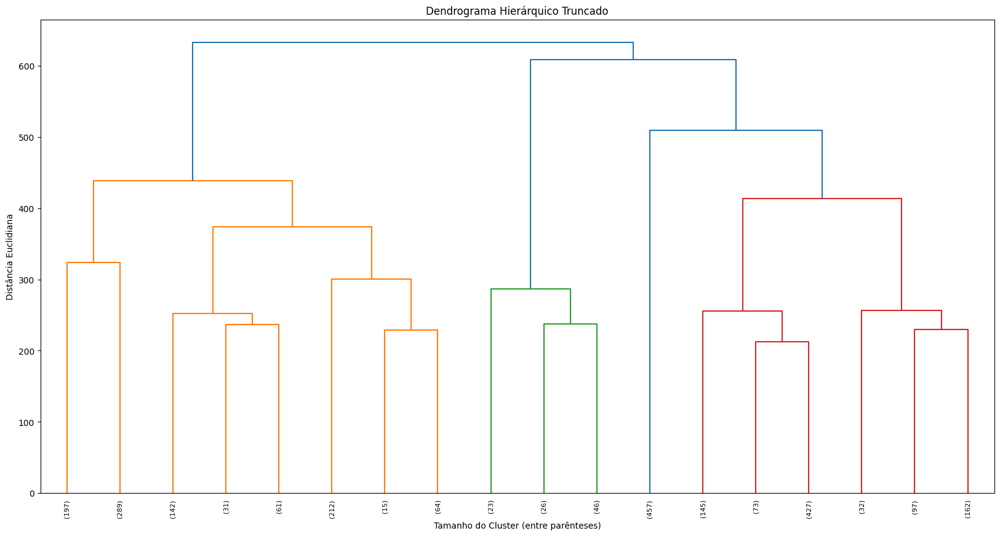

In [106]:
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 1. Padronizar os dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# 2. Gerar o dendrograma TRUNCADO
print("Calculando o linkage para o dendrograma truncado...")
plt.figure(figsize=(20, 10))

dendrogram_truncado = sch.dendrogram(
    sch.linkage(X_scaled, method='ward'),
    truncate_mode='lastp',  # Mostra apenas os últimos 'p' clusters fundidos
    p=18,                   # O número de fusões finais a serem mostradas
    leaf_rotation=90.,
    leaf_font_size=8.,
)

plt.title('Dendrograma Hierárquico Truncado')
plt.xlabel('Tamanho do Cluster (entre parênteses)')
plt.ylabel('Distância Euclidiana')
plt.show()

### Linkege Ward

In [107]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

print("Iniciando o Clustering Hierárquico (linkage='ward')...")
# testei com 18, 8, 6, 5 e 4 e 5 foi o que deu melhor resultado
# deixei, 4 pois para compara com o kmeans que deu o maior resultado
k_ideal = 4
# Definimos o modelo com os parâmetros solicitados
hierarchical_ward = AgglomerativeClustering(n_clusters=k_ideal, linkage='ward')

# O método .fit_predict treina o modelo e retorna os rótulos dos clusters em um único passo
labels_ward = hierarchical_ward.fit_predict(X_cluster)

# Avaliar os Resultados 
# Calcular o Score de Silhueta
silhouette_ward = silhouette_score(X_cluster, labels_ward)
print(f"\nScore de Silhueta para o método 'ward': {silhouette_ward:.4f}")
# Calcular Davies-Bouldin Index e Calinski-Harabasz Index
db_index = davies_bouldin_score(X_cluster, labels_ward)
print("Davies-Bouldin Index:", db_index)
# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(X_cluster, labels_ward)
print("Calinski-Harabasz Index:", ch_index)

# Adicionar os rótulos ao DataFrame principal para análise
df_features['hierarchical_ward_cluster'] = labels_ward

# Analisar a Distribuição 
print("\nDistribuição dos vídeos por cluster (Hierárquico - Ward):")
print(df_features['hierarchical_ward_cluster'].value_counts().sort_index())

Iniciando o Clustering Hierárquico (linkage='ward')...

Score de Silhueta para o método 'ward': 0.1719
Davies-Bouldin Index: 1.7594550476616444
Calinski-Harabasz Index: 554.758347648717

Distribuição dos vídeos por cluster (Hierárquico - Ward):
hierarchical_ward_cluster
0    864
1    803
2    582
3    250
Name: count, dtype: int64


### Linkage average 

In [108]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

print("Iniciando o Clustering Hierárquico (linkage='complete')...")
# o k ideal que testei foi 18, 6, 5, e 4 e 4 foi o que deu melhor resultado
k_ideal = 4
# Definimos o modelo com os parâmetros solicitados
hierarchical_complete = AgglomerativeClustering(n_clusters=k_ideal, linkage='average')

# O método .fit_predict treina o modelo e retorna os rótulos dos clusters
labels_average = hierarchical_complete.fit_predict(X_cluster)

# Avaliar os Resultados 
# Calcular o Score de Silhueta
silhouette_complete = silhouette_score(X_cluster, labels_average)
print(f"\nScore de Silhueta para o método 'complete': {silhouette_complete:.4f}")
# Calcular Davies-Bouldin Index e Calinski-Harabasz Index
db_index = davies_bouldin_score(X_cluster, labels_average)
print("Davies-Bouldin Index:", db_index)
# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(X_cluster, labels_average)
print("Calinski-Harabasz Index:", ch_index)

# Adicionar os rótulos ao DataFrame principal para análise
df_features['hierarchical_complete_cluster'] = labels_average

# Analisar a Distribuição ---
print("\nDistribuição dos vídeos por cluster (Hierárquico - average):")
print(df_features['hierarchical_complete_cluster'].value_counts().sort_index())

Iniciando o Clustering Hierárquico (linkage='complete')...

Score de Silhueta para o método 'complete': 0.1651
Davies-Bouldin Index: 1.159722032201802
Calinski-Harabasz Index: 69.09369774815129

Distribuição dos vídeos por cluster (Hierárquico - average):
hierarchical_complete_cluster
0    2391
1      10
2      96
3       2
Name: count, dtype: int64


## Avaliação dos clusters

In [109]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import pandas as pd

# Dicionário para mapear os nomes dos modelos às suas colunas de rótulos
model_labels = {
    f'K-Means ({k_ideal})': 'kmeans_cluster',
    'MeanShift': 'meanshift_cluster',
    'Hierárquico (Ward)': 'hierarchical_ward_cluster',
    'Hierárquico (average)': 'hierarchical_complete_cluster'
}

# Lista para armazenar os resultados
resultados = []

print("Calculando métricas de avaliação para cada modelo...")

# Loop para calcular as métricas para cada modelo
for model_name, label_column in model_labels.items():
    if label_column in df_features.columns:
        labels = df_features[label_column]
        
        # As métricas só podem ser calculadas se houver mais de 1 cluster
        if len(set(labels)) > 1:
            silhouette = silhouette_score(X_cluster, labels)
            davies_bouldin = davies_bouldin_score(X_cluster, labels)
            calinski_harabasz = calinski_harabasz_score(X_cluster, labels)
            
            resultados.append({
                'Modelo': model_name,
                'Score de Silhueta (↑)': silhouette,
                'Davies-Bouldin (↓)': davies_bouldin,
                'Calinski-Harabasz (↑)': calinski_harabasz
            })
        else:
            print(f"Aviso: O modelo '{model_name}' encontrou apenas 1 cluster. As métricas não podem ser calculadas.")
    else:
        print(f"Aviso: A coluna de cluster '{label_column}' não foi encontrada. Pulando o modelo '{model_name}'.")

# Criar um DataFrame com os resultados
df_comparacao = pd.DataFrame(resultados)
# Ordenar pelo Score de Silhueta para ver o melhor
df_comparacao = df_comparacao.sort_values(by='Score de Silhueta (↑)', ascending=False)

print("\n--- Tabela Comparativa dos Modelos de Clusterização ---")
# As setas (↑, ↓) indicam se valores maiores ou menores são melhores para cada métrica
display(df_comparacao.round(4))

Calculando métricas de avaliação para cada modelo...
Aviso: A coluna de cluster 'meanshift_cluster' não foi encontrada. Pulando o modelo 'MeanShift'.

--- Tabela Comparativa dos Modelos de Clusterização ---


,Modelo,Score de Silhueta (↑),Davies-Bouldin (↓),Calinski-Harabasz (↑)
0,K-Means (4),0.1868,1.7664,605.4078
1,Hierárquico (Ward),0.1719,1.7595,554.7583
2,Hierárquico (average),0.1651,1.1597,69.0937


## Testando sem o Z 

In [110]:
df_sem_Z = pd.read_csv('features_temporais_sem_Z.csv', index_col=0)

In [111]:
from sklearn.preprocessing import LabelEncoder
import pandas as pd


print("--- Separando Características (X), Rótulo (y) e Grupos ---")

if 'file_name' not in df_sem_Z.columns:
    df_sem_Z.reset_index(inplace=True)

info_df = sinais[['file_name', 'interprete']].drop_duplicates()
df_final = df_sem_Z.merge(info_df, on='file_name', how='left')


# Criar a variável de rótulos (y) a partir da coluna 'sinal' e codificá-la
encoder = LabelEncoder()
y = encoder.fit_transform(df_final['sinal'])
labels = encoder.classes_ # Guardar os nomes das classes para os gráficos

# Definir os grupos
groups = df_final['interprete']

# Definir o X (características) removendo todas as colunas de metadados
colunas_para_remover = ['file_name', 'sinal', 'interprete']
X = df_final.drop(columns=colunas_para_remover)

print("Separação concluída!")
print(f"Shape de X (características): {X.shape}")
print(f"Shape de y (rótulos): {y.shape}")
print(f"Shape de groups: {groups.shape}")

--- Separando Características (X), Rótulo (y) e Grupos ---
Separação concluída!
Shape de X (características): (2499, 990)
Shape de y (rótulos): (2499,)
Shape de groups: (2499,)


### K-means

--- Preparando os Dados para Clusterização ---
Calculando a inércia para diferentes valores de K...


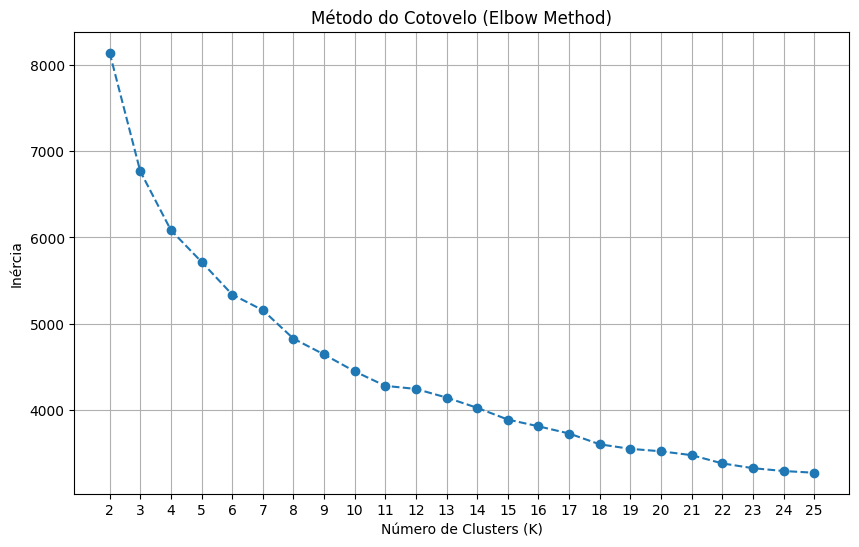

In [112]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pandas as pd


print("--- Preparando os Dados para Clusterização ---")
# Garantir que estamos usando apenas os dados numéricos
X_cluster = X.select_dtypes(include=['float64', 'int64'])


# Lista para armazenar os valores da inércia para cada valor de K
inercia = []
# Faixa de valores de K que vamos testar
k_range = range(2, 26) # Testaremos de 2 a 26 clusters

print("Calculando a inércia para diferentes valores de K...")
for k in k_range:
    # Cria e treina o modelo K-Means
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_cluster)
    
    # Armazena a inércia do modelo treinado
    inercia.append(kmeans.inertia_)

# Plotar o Gráfico do Cotovelo ---
plt.figure(figsize=(10, 6))
plt.plot(k_range, inercia, marker='o', linestyle='--')
plt.title('Método do Cotovelo (Elbow Method)')
plt.xlabel('Número de Clusters (K)')
plt.ylabel('Inércia')
plt.xticks(k_range)
plt.grid(True)
plt.show()

In [113]:
from sklearn.cluster import KMeans
import pandas as pd

# testei com 18, 8, 6 e 4 e 4 foi o que deu melhor resultado
k_ideal = 4

print(f"Aplicando o K-Means com k={k_ideal}...")

# Inicializar e treinar o modelo K-Means
kmeans_final = KMeans(n_clusters=k_ideal, random_state=42, n_init='auto')
kmeans_final.fit(X_cluster)

# Adicionar os rótulos dos clusters de volta ao DataFrame principal
# Isso nos permite ver a qual cluster cada vídeo pertence
df_sem_Z['kmeans_cluster'] = kmeans_final.labels_

print("\nClusterização com K-Means concluída!")
print("Amostra do DataFrame com a nova coluna de cluster:")

print(df_sem_Z[['file_name', 'kmeans_cluster']].head())

# Vamos ver quantos vídeos foram atribuídos a cada cluster
print("\nDistribuição dos vídeos por cluster:")
print(df_sem_Z['kmeans_cluster'].value_counts().sort_index())

Aplicando o K-Means com k=4...

Clusterização com K-Means concluída!
Amostra do DataFrame com a nova coluna de cluster:
           file_name  kmeans_cluster
0   Adicao_AP_1.json               0
1  Adicao_AP_10.json               0
2   Adicao_AP_2.json               0
3   Adicao_AP_3.json               0
4   Adicao_AP_4.json               0

Distribuição dos vídeos por cluster:
kmeans_cluster
0    469
1    635
2    768
3    627
Name: count, dtype: int64


Para k=4, o Score de Silhueta médio é: 0.2060

Reduzindo a dimensionalidade com PCA para visualização...
Gerando o gráfico dos clusters...


C:\Users\augusto\AppData\Local\Temp\ipykernel_10760\1132524135.py:28: UserWarning: The palette list has more values (18) than needed (4), which may not be intended.
  sns.scatterplot(


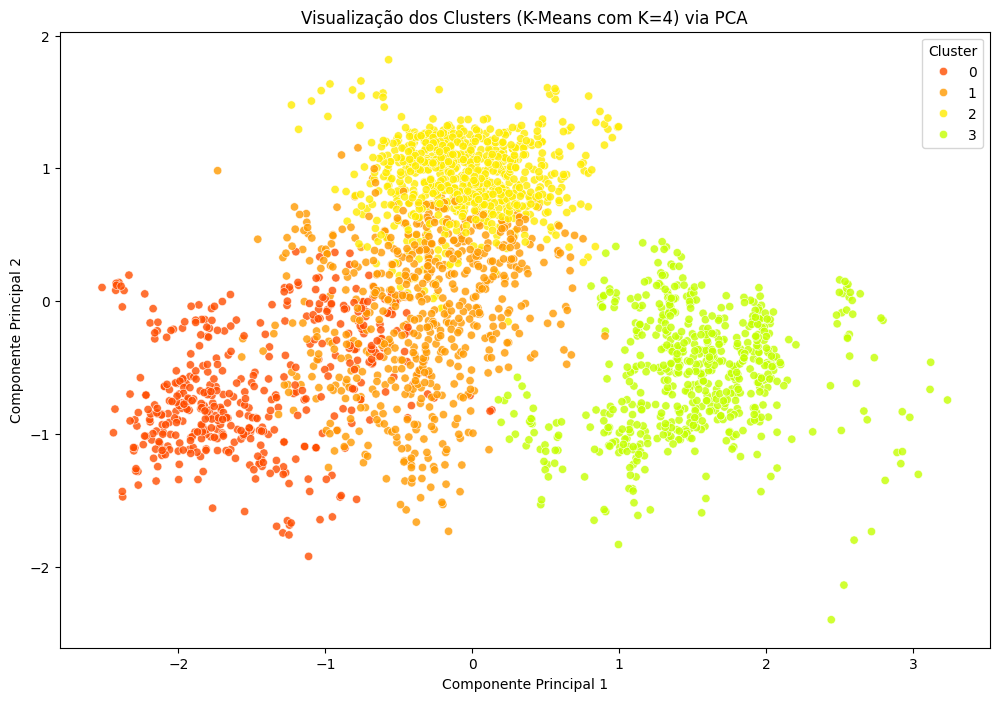

In [114]:
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Calcular o Score de Silhueta ---
# A métrica compara a distância média intra-cluster com a distância média inter-cluster.
# Quanto mais próximo de 1, melhor.
silhouette_avg = silhouette_score(X_cluster, df_sem_Z['kmeans_cluster'])

print(f"Para k={k_ideal}, o Score de Silhueta médio é: {silhouette_avg:.4f}")


# --- 2. Visualizar os Clusters com PCA ---
print("\nReduzindo a dimensionalidade com PCA para visualização...")
# Reduzir os dados para 2 componentes principais
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_cluster)

# Criar um novo DataFrame para facilitar a plotagem
df_pca = pd.DataFrame(data=X_pca, columns=['Componente Principal 1', 'Componente Principal 2'])
df_pca['Cluster'] = df_sem_Z['kmeans_cluster']


# --- 3. Plotar o Gráfico de Dispersão ---
print("Gerando o gráfico dos clusters...")
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x="Componente Principal 1", y="Componente Principal 2",
    hue="Cluster",
    palette=sns.color_palette("hsv", n_colors=18), # Paleta de cores para os 18 clusters
    data=df_pca,
    legend="full",
    alpha=0.8
)
plt.title(f'Visualização dos Clusters (K-Means com K={k_ideal}) via PCA')
plt.show()

### Hieraquico 

Calculando o linkage para o dendrograma truncado...


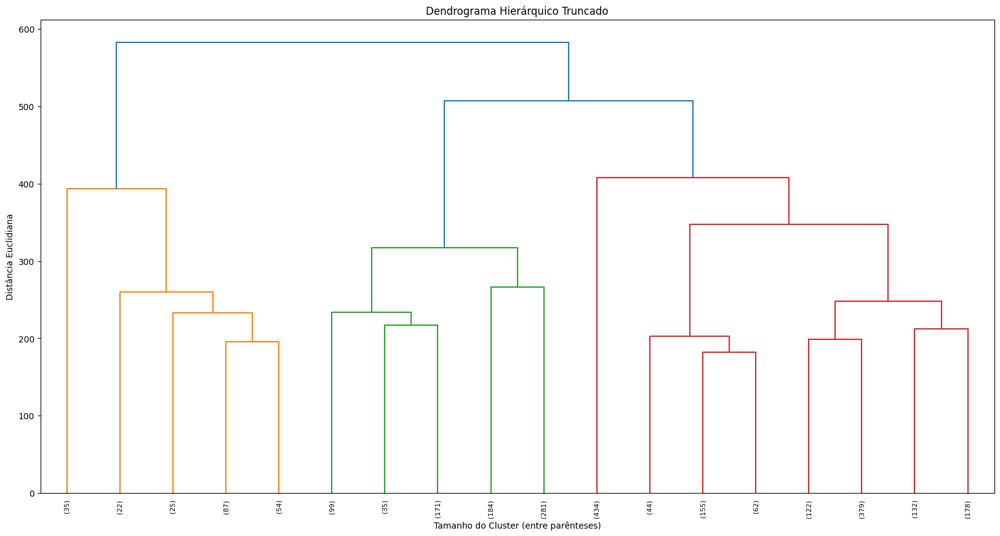

In [115]:
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 1. Padronizar os dados
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# 2. Gerar o dendrograma TRUNCADO
print("Calculando o linkage para o dendrograma truncado...")
plt.figure(figsize=(20, 10))

dendrogram_truncado = sch.dendrogram(
    sch.linkage(X_scaled, method='ward'),
    truncate_mode='lastp',  # Mostra apenas os últimos 'p' clusters fundidos
    p=18,                   # O número de fusões finais a serem mostradas
    leaf_rotation=90.,
    leaf_font_size=8.,
)

plt.title('Dendrograma Hierárquico Truncado')
plt.xlabel('Tamanho do Cluster (entre parênteses)')
plt.ylabel('Distância Euclidiana')
plt.show()

#### Linkege Ward

In [116]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

print("Iniciando o Clustering Hierárquico (linkage='ward')...")

# Definimos o modelo com os parâmetros solicitados
hierarchical_ward = AgglomerativeClustering(n_clusters=k_ideal, linkage='ward')

# O método .fit_predict treina o modelo e retorna os rótulos dos clusters em um único passo
labels_ward = hierarchical_ward.fit_predict(X_cluster)

# Avaliar os Resultados 
# Calcular o Score de Silhueta
silhouette_ward = silhouette_score(X_cluster, labels_ward)
print(f"\nScore de Silhueta para o método 'ward': {silhouette_ward:.4f}")
# Calcular Davies-Bouldin Index e Calinski-Harabasz Index
db_index = davies_bouldin_score(X_cluster, labels_ward)
print("Davies-Bouldin Index:", db_index)
# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(X_cluster, labels_ward)
print("Calinski-Harabasz Index:", ch_index)

# Adicionar os rótulos ao DataFrame principal para análise
df_sem_Z['hierarchical_ward_cluster'] = labels_ward

# Analisar a Distribuição 
print("\nDistribuição dos vídeos por cluster (Hierárquico - Ward):")
print(df_sem_Z['hierarchical_ward_cluster'].value_counts().sort_index())

Iniciando o Clustering Hierárquico (linkage='ward')...

Score de Silhueta para o método 'ward': 0.2045
Davies-Bouldin Index: 1.9496875783949497
Calinski-Harabasz Index: 496.4220512615312

Distribuição dos vídeos por cluster (Hierárquico - Ward):
hierarchical_ward_cluster
0    1101
1     579
2     490
3     329
Name: count, dtype: int64


#### Linkage Average

In [117]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

print("Iniciando o Clustering Hierárquico (linkage='Average')...")

# Definimos o modelo com os parâmetros solicitados
hierarchical_complete = AgglomerativeClustering(n_clusters=k_ideal, linkage='average')

# O método .fit_predict treina o modelo e retorna os rótulos dos clusters
labels_average = hierarchical_complete.fit_predict(X_cluster)

# Avaliar os Resultados 
# Calcular o Score de Silhueta
silhouette_complete = silhouette_score(X_cluster, labels_average)
print(f"\nScore de Silhueta para o método 'complete': {silhouette_complete:.4f}")
# Calcular Davies-Bouldin Index e Calinski-Harabasz Index
db_index = davies_bouldin_score(X_cluster, labels_average)
print("Davies-Bouldin Index:", db_index)
# Calinski-Harabasz Index
ch_index = calinski_harabasz_score(X_cluster, labels_average)
print("Calinski-Harabasz Index:", ch_index)

# Adicionar os rótulos ao DataFrame principal para análise
df_sem_Z['hierarchical_complete_cluster'] = labels_average

# Analisar a Distribuição ---
print("\nDistribuição dos vídeos por cluster (Hierárquico - Complete):")
print(df_sem_Z['hierarchical_complete_cluster'].value_counts().sort_index())

Iniciando o Clustering Hierárquico (linkage='Average')...

Score de Silhueta para o método 'complete': 0.2628
Davies-Bouldin Index: 0.8509249964030228
Calinski-Harabasz Index: 40.176203953467585

Distribuição dos vídeos por cluster (Hierárquico - Complete):
hierarchical_complete_cluster
0    2472
1      20
2       1
3       6
Name: count, dtype: int64


## Avaliando cluster


In [118]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import pandas as pd

# Dicionário para mapear os nomes dos modelos às suas colunas de rótulos
model_labels = {
    f'K-Means (K={k_ideal})': 'kmeans_cluster',
    'Hierárquico (Ward)': 'hierarchical_ward_cluster',
    'Hierárquico (average)': 'hierarchical_complete_cluster'
}

# Lista para armazenar os resultados
resultados = []

print("Calculando métricas de avaliação para cada modelo...")

# Loop para calcular as métricas para cada modelo
for model_name, label_column in model_labels.items():
    if label_column in df_sem_Z.columns:
        labels = df_sem_Z[label_column]
        
        # As métricas só podem ser calculadas se houver mais de 1 cluster
        if len(set(labels)) > 1:
            silhouette = silhouette_score(X_cluster, labels)
            davies_bouldin = davies_bouldin_score(X_cluster, labels)
            calinski_harabasz = calinski_harabasz_score(X_cluster, labels)
            
            resultados.append({
                'Modelo': model_name,
                'Score de Silhueta (↑)': silhouette,
                'Davies-Bouldin (↓)': davies_bouldin,
                'Calinski-Harabasz (↑)': calinski_harabasz
            })
        else:
            print(f"Aviso: O modelo '{model_name}' encontrou apenas 1 cluster. As métricas não podem ser calculadas.")
    else:
        print(f"Aviso: A coluna de cluster '{label_column}' não foi encontrada. Pulando o modelo '{model_name}'.")

# Criar um DataFrame com os resultados
df_comparacao = pd.DataFrame(resultados)
# Ordenar pelo Score de Silhueta para ver o melhor
df_comparacao = df_comparacao.sort_values(by='Score de Silhueta (↑)', ascending=False)

print("\n--- Tabela Comparativa dos Modelos de Clusterização ---")
# As setas (↑, ↓) indicam se valores maiores ou menores são melhores para cada métrica
display(df_comparacao.round(4))

Calculando métricas de avaliação para cada modelo...

--- Tabela Comparativa dos Modelos de Clusterização ---


,Modelo,Score de Silhueta (↑),Davies-Bouldin (↓),Calinski-Harabasz (↑)
2,Hierárquico (average),0.2628,0.8509,40.1762
0,K-Means (K=4),0.2060,1.7256,586.2950
1,Hierárquico (Ward),0.2045,1.9497,496.4221
